### yolo

In [3]:
import cv2
import os
from ultralytics import YOLO

# Entradas
image_path = "images/codigos2.jpg"
model_path = "runs/detect/train/weights/best.pt"

# Salidas
output_dir = "output_yolo"
os.makedirs(output_dir, exist_ok=True)
cropped_dir = os.path.join(output_dir, "cropped")
os.makedirs(cropped_dir, exist_ok=True)

# Cargar modelo YOLO
model = YOLO(model_path)

# Procesar imagen
results = model(image_path)
annotated_image = results[0].plot()

# Guardar imagen con detecciones
cv2.imwrite(os.path.join(output_dir, "detections.jpg"), annotated_image)
print("✅ Imagen con detecciones guardada en 'detections.jpg'")

# Cargar imagen original
image = cv2.imread(image_path)

# Diccionario para nombrar las clases
class_names = {
    0: "header",
    1: "other",      # ejemplo si hay otras clases
    2: "barcode"
}

# Recortar cada región detectada por clase
for i, (box, cls) in enumerate(zip(results[0].boxes.xyxy.cpu().numpy(),
                                   results[0].boxes.cls.cpu().numpy())):
    x1, y1, x2, y2 = map(int, box)
    class_id = int(cls)
    class_name = class_names.get(class_id, f"class{class_id}")

    # Recortar y guardar imagen
    cropped = image[y1:y2, x1:x2]
    crop_filename = f"{class_name}_{i}.jpg"
    cv2.imwrite(os.path.join(cropped_dir, crop_filename), cropped)
    print(f"🟩 Región '{class_name}' recortada y guardada como {crop_filename}")


Creating new Ultralytics Settings v0.0.6 file  
View Ultralytics Settings with 'yolo settings' or at 'C:\Users\Andrea\AppData\Roaming\Ultralytics\settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

image 1/1 c:\Users\Andrea\OneDrive - Universidad de Las Palmas de Gran Canaria\Desktop\cuarto\Segundo_cuatri\TFG\sam2\notebooks\images\codigos2.jpg: 640x384 1 header, 1 barcode, 62.7ms
Speed: 5.4ms preprocess, 62.7ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 384)
✅ Imagen con detecciones guardada en 'detections.jpg'
🟩 Región 'barcode' recortada y guardada como barcode_0.jpg
🟩 Región 'header' recortada y guardada como header_1.jpg


In [ ]:
import pytesseract

# Specify the path to the Tesseract executable if it's not in your PATH
pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'  # Update this path as needed

In [13]:
import cv2
import numpy as np
import pytesseract
import os

# Crear carpeta para guardar imágenes del proceso
output_folder = "header"
os.makedirs(output_folder, exist_ok=True)

# Cargar la imagen
image_path = "images/codigos8.jpg"
image = cv2.imread(image_path)

# Guardar imagen original
cv2.imwrite(os.path.join(output_folder, "1_original.jpg"), image)

# Convertir a escala de grises
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2.imwrite(os.path.join(output_folder, "2_grayscale.jpg"), gray)

# Aplicar umbralización (binarización) para resaltar texto
thresh = cv2.adaptiveThreshold(
    gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
)
cv2.imwrite(os.path.join(output_folder, "3_binarized.jpg"), thresh)

# Encontrar contornos para identificar la cabecera
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filtrar los contornos para encontrar la cabecera (basado en posición y tamaño)
header_contour = None
header_y_max = 0

for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    if w > image.shape[1] * 0.5 and h < image.shape[0] * 0.2 and y < image.shape[0] * 0.3:
        if y > header_y_max:
            header_y_max = y
            header_contour = (x, y, w, h)

# Dibujar contornos detectados
image_contours = image.copy()
cv2.drawContours(image_contours, contours, -1, (0, 255, 0), 2)
cv2.imwrite(os.path.join(output_folder, "4_detected_contours.jpg"), image_contours)

# # Si se detecta cabecera, extraer la región y segmentar los campos
# header_data = {
#     "Número de SOE de la farmacia": "-",
#     "Día": "-",
#     "Hora": "-",
#     "Número de orden": "-"
# }

# if header_contour:
#     x, y, w, h = header_contour
#     header_region = image[y:y + h, x:x + w]
#     cv2.imwrite(os.path.join(output_folder, "5_header_detected.jpg"), header_region)

#     # Dibujar líneas horizontales para segmentar los campos de texto
#     num_lines = 4
#     step = h // num_lines
#     for i in range(1, num_lines + 1):
#         cv2.line(header_region, (0, i * step), (w, i * step), (0, 255, 0), 2)

#     # Guardar imagen con líneas separadoras
#     cv2.imwrite(os.path.join(output_folder, "6_header_lines.jpg"), header_region)

#     # Extraer y procesar cada campo
#     field_names = list(header_data.keys())
#     for i in range(num_lines):
#         # Recortar cada sección donde está la información escrita a mano
#         field_y1 = y + i * step
#         field_y2 = y + (i + 1) * step
#         field_region = image[field_y1:field_y2, x + w // 2 : x + w]  # Solo la parte derecha

#         # Convertir la sección a escala de grises y aplicar OCR
#         field_gray = cv2.cvtColor(field_region, cv2.COLOR_BGR2GRAY)
#         cv2.imwrite(os.path.join(output_folder, f"7_field_{field_names[i]}.jpg"), field_gray)

#         field_text = pytesseract.image_to_string(field_gray, lang="spa").strip()

#         # Correcciones y validaciones
#         if field_names[i] == "Número de SOE de la farmacia":
#             field_text = "".join(filter(str.isdigit, field_text))[:3]  # Extraer solo los primeros 3 dígitos
#         elif field_names[i] == "Día" and "FEB" in field_text:
#             field_text = field_text.replace("2075", "2025")  # Corregir año erróneo
#         elif field_names[i] == "Número de orden":
#             field_text = "".join(filter(str.isdigit, field_text))[:1]  # Asegurar que es un solo dígito

#         # Asignar el texto extraído al campo correspondiente
#         header_data[field_names[i]] = field_text if field_text else "-"

# else:
#     header_data = "No se detectó cabecera en la imagen."

# # Devolver la carpeta con imágenes y los datos extraídos
# output_folder, header_data


True

### Me gusta

In [19]:
# Cargar la imagen
image_path = "images/codigos1.jpg"
image = cv2.imread(image_path)

# Crear carpeta para guardar imágenes del proceso
output_folder = "header"
os.makedirs(output_folder, exist_ok=True)

# Guardar imagen original
cv2.imwrite(os.path.join(output_folder, "1_original.jpg"), image)

# Convertir a escala de grises
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2.imwrite(os.path.join(output_folder, "2_grayscale.jpg"), gray)

# Aplicar umbralización (binarización) para resaltar texto manuscrito
thresh = cv2.adaptiveThreshold(
    gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
)
cv2.imwrite(os.path.join(output_folder, "3_binarized.jpg"), thresh)

# Encontrar contornos de texto manuscrito
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filtrar contornos relevantes para detectar los campos de escritura
field_contours = []
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    if w > image.shape[1] * 0.1 and h > 15:  # Filtrar áreas suficientemente grandes
        field_contours.append((x, y, w, h))

# Ordenar los contornos detectados por su posición vertical
field_contours = sorted(field_contours, key=lambda b: b[1])

# Dibujar los contornos detectados en la imagen
image_contours = image.copy()
for x, y, w, h in field_contours:
    cv2.rectangle(image_contours, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Guardar la imagen con los contornos detectados
cv2.imwrite(os.path.join(output_folder, "4_detected_contours.jpg"), image_contours)

# # **Deducción de las áreas correctas según posiciones esperadas**
# header_data = {
#     "Número de SOE de la farmacia": "-",
#     "Día": "-",
#     "Hora": "-",
#     "Número de orden": "-"
# }

# # Posiciones esperadas (ajustables según necesidad)
# expected_positions = {
#     "Número de SOE de la farmacia": (0.05, 0.20),  # Primera línea, izquierda o sello superior derecho
#     "Día": (0.25, 0.45),  # Segunda línea, izquierda o dentro del sello azul
#     "Número de orden": (0.75, 0.90),  # Última línea, izquierda
# }

# # Extraer texto de las áreas esperadas
# for field, (min_y_ratio, max_y_ratio) in expected_positions.items():
#     # Filtrar contornos dentro del rango vertical esperado
#     matching_contours = [
#         (x, y, w, h) for (x, y, w, h) in field_contours if min_y_ratio * image.shape[0] < y < max_y_ratio * image.shape[0]
#     ]
    
#     # Si encontramos contornos en la zona esperada, extraemos el texto
#     if matching_contours:
#         best_contour = sorted(matching_contours, key=lambda b: b[0])[0]  # Tomar el más a la izquierda
#         x, y, w, h = best_contour
#         field_region = gray[y:y + h, x:x + w]

#         # Guardar imagen de la región de texto detectada
#         cv2.imwrite(os.path.join(output_folder, f"5_field_{field}.jpg"), field_region)

#         # Aplicar OCR
#         field_text = pytesseract.image_to_string(field_region, lang="spa").strip()

#         # Correcciones específicas para cada campo
#         if field == "Número de SOE de la farmacia":
#             field_text = "".join(filter(str.isdigit, field_text))[:3]  # Extraer solo los 3 primeros dígitos
#         elif field == "Día" and "FEB" in field_text:
#             field_text = field_text.replace("2075", "2025")  # Corregir año erróneo
#         elif field == "Número de orden":
#             field_text = "".join(filter(str.isdigit, field_text))[:1]  # Asegurar que es un solo dígito

#         header_data[field] = field_text if field_text else "-"

# # Guardar la imagen final con los ajustes corregidos
# cv2.imwrite(os.path.join(output_folder, "6_final_detection.jpg"), image_contours)

# # Devolver la carpeta con imágenes y los datos extraídos
# output_folder, header_data


True

In [17]:
# Cargar la imagen
image_path = "images/codigos6.jpg"
image = cv2.imread(image_path)

# Crear carpeta para guardar imágenes del proceso
output_folder = "header"
os.makedirs(output_folder, exist_ok=True)

# Guardar imagen original
cv2.imwrite(os.path.join(output_folder, "1_original.jpg"), image)

# Convertir a escala de grises
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2.imwrite(os.path.join(output_folder, "2_grayscale.jpg"), gray)

# Aplicar umbralización (binarización) para resaltar texto manuscrito
thresh = cv2.adaptiveThreshold(
    gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
)
cv2.imwrite(os.path.join(output_folder, "3_binarized.jpg"), thresh)

# Encontrar contornos de texto manuscrito
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filtrar contornos relevantes para detectar los campos de escritura
field_contours = []
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    if w > image.shape[1] * 0.1 and h > 15:  # Filtrar áreas suficientemente grandes
        field_contours.append((x, y, w, h))

# Ordenar los contornos detectados por su posición vertical
field_contours = sorted(field_contours, key=lambda b: b[1])

# Dibujar los contornos detectados en la imagen
image_contours = image.copy()
for x, y, w, h in field_contours:
    cv2.rectangle(image_contours, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Guardar la imagen con los contornos detectados
cv2.imwrite(os.path.join(output_folder, "4_detected_contours.jpg"), image_contours)

# # **Deducción de las áreas correctas según posiciones esperadas**
# header_data = {
#     "Número de SOE de la farmacia": "-",
#     "Día": "-",
#     "Hora": "-",
#     "Número de orden": "-"
# }

# # Posiciones esperadas (ajustables según necesidad)
# expected_positions = {
#     "Número de SOE de la farmacia": (0.05, 0.20),  # Primera línea, izquierda o sello superior derecho
#     "Día": (0.25, 0.45),  # Segunda línea, izquierda o dentro del sello azul
#     "Número de orden": (0.75, 0.90),  # Última línea, izquierda
# }

# # Extraer texto de las áreas esperadas
# for field, (min_y_ratio, max_y_ratio) in expected_positions.items():
#     # Filtrar contornos dentro del rango vertical esperado
#     matching_contours = [
#         (x, y, w, h) for (x, y, w, h) in field_contours if min_y_ratio * image.shape[0] < y < max_y_ratio * image.shape[0]
#     ]
    
#     # Si encontramos contornos en la zona esperada, extraemos el texto
#     if matching_contours:
#         best_contour = sorted(matching_contours, key=lambda b: b[0])[0]  # Tomar el más a la izquierda
#         x, y, w, h = best_contour
#         field_region = gray[y:y + h, x:x + w]

#         # Guardar imagen de la región de texto detectada
#         cv2.imwrite(os.path.join(output_folder, f"5_field_{field}.jpg"), field_region)

#         # Aplicar OCR
#         field_text = pytesseract.image_to_string(field_region, lang="spa").strip()

#         # Correcciones específicas para cada campo
#         if field == "Número de SOE de la farmacia":
#             field_text = "".join(filter(str.isdigit, field_text))[:3]  # Extraer solo los 3 primeros dígitos
#         elif field == "Día" and "FEB" in field_text:
#             field_text = field_text.replace("2075", "2025")  # Corregir año erróneo
#         elif field == "Número de orden":
#             field_text = "".join(filter(str.isdigit, field_text))[:1]  # Asegurar que es un solo dígito

#         header_data[field] = field_text if field_text else "-"

# # Guardar la imagen final con los ajustes corregidos
# cv2.imwrite(os.path.join(output_folder, "6_final_detection.jpg"), image_contours)

# # Devolver la carpeta con imágenes y los datos extraídos
# output_folder, header_data



# estoy usando esa imagen y el código q me pasaste, osea el anteior código, y me devuelve esto:

# ('header',
#  {'Número de SOE de la farmacia': '-',
#   'Día': 'uw-msw…\nTamsulzine STADA\n30 comp. de 6 plonoa M\n\nJNANO',
#   'Hora': '-',
#   'Número de orden': '-'})

True

### Me gusta

In [18]:
# Cargar la imagen
image_path = "images/codigos1.jpg"
image = cv2.imread(image_path)

# Crear carpeta para guardar imágenes del proceso
output_folder = "header"
os.makedirs(output_folder, exist_ok=True)

# Guardar imagen original
cv2.imwrite(os.path.join(output_folder, "1_original.jpg"), image)

# Convertir a escala de grises
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2.imwrite(os.path.join(output_folder, "2_grayscale.jpg"), gray)

# Aplicar un filtro de suavizado para reducir el ruido
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Aplicar umbralización (binarización) para resaltar el texto
thresh = cv2.adaptiveThreshold(
    blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
)
cv2.imwrite(os.path.join(output_folder, "3_binarized.jpg"), thresh)

# Aplicar morfología para mejorar la segmentación del texto
kernel = np.ones((3, 3), np.uint8)
dilated = cv2.dilate(thresh, kernel, iterations=1)
cv2.imwrite(os.path.join(output_folder, "4_dilated.jpg"), dilated)

# Encontrar contornos
contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filtrar contornos relevantes
field_contours = []
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    if w > image.shape[1] * 0.2 and h > 15:  # Filtrar áreas suficientemente grandes
        field_contours.append((x, y, w, h))

# Ordenar contornos por posición vertical
field_contours = sorted(field_contours, key=lambda b: b[1])

# Dibujar los contornos detectados en la imagen
image_contours = image.copy()
for x, y, w, h in field_contours:
    cv2.rectangle(image_contours, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Guardar la imagen con los contornos detectados
cv2.imwrite(os.path.join(output_folder, "5_detected_contours.jpg"), image_contours)

# # **Detección de líneas horizontales para segmentar correctamente la cabecera**
# edges = cv2.Canny(gray, 50, 150, apertureSize=3)
# lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=200, minLineLength=100, maxLineGap=10)

# # Dibujar líneas detectadas
# image_lines = image.copy()
# if lines is not None:
#     for line in lines:
#         x1, y1, x2, y2 = line[0]
#         cv2.line(image_lines, (x1, y1), (x2, y2), (0, 255, 0), 2)

# cv2.imwrite(os.path.join(output_folder, "6_detected_lines.jpg"), image_lines)

# # **Deducción de las áreas correctas**
# header_data = {
#     "Número de SOE de la farmacia": "-",
#     "Día": "-",
#     "Hora": "-",
#     "Número de orden": "-"
# }

# # Extraer información de las regiones esperadas
# for field, (min_y_ratio, max_y_ratio) in {
#     "Número de SOE de la farmacia": (0.05, 0.20),  
#     "Día": (0.25, 0.45),  
#     "Número de orden": (0.75, 0.90)  
# }.items():
#     # Buscar el contorno en la posición esperada
#     matching_contours = [
#         (x, y, w, h) for (x, y, w, h) in field_contours if min_y_ratio * image.shape[0] < y < max_y_ratio * image.shape[0]
#     ]
    
#     if matching_contours:
#         best_contour = sorted(matching_contours, key=lambda b: b[0])[0]  # Tomar el más a la izquierda
#         x, y, w, h = best_contour
#         field_region = gray[y:y + h, x:x + w]

#         # Guardar la región de interés
#         cv2.imwrite(os.path.join(output_folder, f"7_field_{field}.jpg"), field_region)

#         # Aplicar OCR
#         field_text = pytesseract.image_to_string(field_region, lang="spa").strip()

#         # Correcciones específicas
#         if field == "Número de SOE de la farmacia":
#             field_text = "".join(filter(str.isdigit, field_text))[:3]  
#         elif field == "Día" and "FEB" in field_text:
#             field_text = field_text.replace("2075", "2025")  
#         elif field == "Número de orden":
#             field_text = "".join(filter(str.isdigit, field_text))[:1]  

#         header_data[field] = field_text if field_text else "-"

# # Guardar la imagen final con los ajustes corregidos
# cv2.imwrite(os.path.join(output_folder, "8_final_detection.jpg"), image_lines)

# # Devolver la carpeta con imágenes y los datos extraídos
# output_folder, header_data


True

In [12]:
# Cargar la imagen
import pytesseract
import numpy as np


image_path = "images/codigos1.jpg"
image = cv2.imread(image_path)

# Crear carpeta para guardar imágenes del proceso
output_folder = "header"
os.makedirs(output_folder, exist_ok=True)

# Guardar imagen original
cv2.imwrite(os.path.join(output_folder, "1_original.jpg"), image)

# Convertir a escala de grises
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2.imwrite(os.path.join(output_folder, "2_grayscale.jpg"), gray)

# Aplicar un filtro de suavizado para reducir el ruido
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Aplicar umbralización (binarización) para resaltar el texto
thresh = cv2.adaptiveThreshold(
    blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
)
cv2.imwrite(os.path.join(output_folder, "3_binarized.jpg"), thresh)

# Aplicar morfología para mejorar la segmentación del texto
kernel = np.ones((3, 3), np.uint8)
dilated = cv2.dilate(thresh, kernel, iterations=1)
cv2.imwrite(os.path.join(output_folder, "4_dilated.jpg"), dilated)

# Encontrar contornos
contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filtrar contornos relevantes
field_contours = []
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    if w > image.shape[1] * 0.2 and h > 15:  # Filtrar áreas suficientemente grandes
        field_contours.append((x, y, w, h))

# Ordenar contornos por posición vertical
field_contours = sorted(field_contours, key=lambda b: b[1])

# Dibujar los contornos detectados en la imagen
image_contours = image.copy()
for x, y, w, h in field_contours:
    cv2.rectangle(image_contours, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Guardar la imagen con los contornos detectados
cv2.imwrite(os.path.join(output_folder, "5_detected_contours.jpg"), image_contours)

# # **Detección de líneas horizontales para segmentar correctamente la cabecera**
# edges = cv2.Canny(gray, 50, 150, apertureSize=3)
# lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=200, minLineLength=100, maxLineGap=10)

# # Dibujar líneas detectadas
# image_lines = image.copy()
# if lines is not None:
#     for line in lines:
#         x1, y1, x2, y2 = line[0]
#         cv2.line(image_lines, (x1, y1), (x2, y2), (0, 255, 0), 2)

# cv2.imwrite(os.path.join(output_folder, "6_detected_lines.jpg"), image_lines)

# # **Deducción de las áreas correctas**
# header_data = {
#     "Número de SOE de la farmacia": "-",
#     "Día": "-",
#     "Hora": "-",
#     "Número de orden": "-"
# }

# # Extraer información de las regiones esperadas
# for field, (min_y_ratio, max_y_ratio) in {
#     "Número de SOE de la farmacia": (0.05, 0.20),  
#     "Día": (0.25, 0.45),  
#     "Número de orden": (0.75, 0.90)  
# }.items():
#     # Buscar el contorno en la posición esperada
#     matching_contours = [
#         (x, y, w, h) for (x, y, w, h) in field_contours if min_y_ratio * image.shape[0] < y < max_y_ratio * image.shape[0]
#     ]
    
#     if matching_contours:
#         best_contour = sorted(matching_contours, key=lambda b: b[0])[0]  # Tomar el más a la izquierda
#         x, y, w, h = best_contour
#         field_region = gray[y:y + h, x:x + w]

#         # Guardar la región de interés
#         cv2.imwrite(os.path.join(output_folder, f"7_field_{field}.jpg"), field_region)

#         # Aplicar OCR
#         field_text = pytesseract.image_to_string(field_region, lang="spa").strip()

#         # Correcciones específicas
#         if field == "Número de SOE de la farmacia":
#             field_text = "".join(filter(str.isdigit, field_text))[:3]  
#         elif field == "Día" and "FEB" in field_text:
#             field_text = field_text.replace("2075", "2025")  
#         elif field == "Número de orden":
#             field_text = "".join(filter(str.isdigit, field_text))[:1]  

#         header_data[field] = field_text if field_text else "-"

# # Guardar la imagen final con los ajustes corregidos
# cv2.imwrite(os.path.join(output_folder, "8_final_detection.jpg"), image_lines)

# Devolver la carpeta con imágenes y los datos extraídos
#output_folder, header_data


True

### SAM2

In [1]:
# 1. Clonamos el repo (si no lo has hecho)

!git clone https://github.com/facebookresearch/sam2.git

"git" no se reconoce como un comando interno o externo,
programa o archivo por lotes ejecutable.


In [2]:
! pip install opencv-python matplotlib

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Program Files\Python39\python.exe -m pip install --upgrade pip' command.


In [ ]:


# 2. Añadimos el path
import sys
sys.path.append("sam2")  # Ruta donde está sam2

# 3. Imports de SAM2
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from sam2.models import sam_model_registry
from sam2.build_sam import build_sam_vit_b

# 4. Cargar imagen
image_path = "codigos2.jpg"
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.title("Imagen original")
plt.axis("off")
plt.show()

# 5. Cargar modelo SAM2
device = "cuda" if torch.cuda.is_available() else "cpu"
model_type = "vit_b"
checkpoint = "models/sam2_vit_b.pt"  # Cambia según el modelo descargado

sam = build_sam_vit_b(checkpoint=checkpoint)
sam = sam.to(device)
sam.eval()


In [ ]:
# train_sam2_headers.ipynb

import os
import torch
import numpy as np
import torchvision.transforms as T
import matplotlib.pyplot as plt
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import cv2
from glob import glob
from pathlib import Path
import random
import matplotlib.patches as mpatches

# --- DATASET PERSONALIZADO ---
class SAM2HeaderDataset(Dataset):
    def __init__(self, images_dir, masks_dir, transform=None):
        self.images = sorted(glob(f"{images_dir}/*.jpg"))
        self.masks = sorted(glob(f"{masks_dir}/*.png"))
        self.transform = transform
        self.to_tensor = T.ToTensor()

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        mask_path = self.masks[idx]

        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)

        image_tensor = self.to_tensor(image)
        mask_array = np.array(mask, dtype=np.uint8)

        mask_tensor = torch.from_numpy(mask_array).unsqueeze(0).float()

        return {
            'image': image_tensor,
            'mask': mask_tensor,
            'original_image': image,
            'filename': Path(img_path).name
        }

# --- VISUALIZACIÓN ---
def show_sample(sample):
    img = sample['original_image']
    mask = sample['mask'].squeeze().numpy()

    colors = {
        0: (1, 1, 1, 0),          # fondo
        1: (0.6, 0.6, 0.6, 0.7),  # zona hoja
        2: (0.3, 0.3, 0.3, 0.7),  # cabecera
        3: (1, 1, 1, 0.9),        # zona códigos
    }

    color_mask = np.zeros((*mask.shape, 4))
    for cls in np.unique(mask):
        color_mask[mask == cls] = colors.get(cls, (1, 0, 0, 0.5))  # rojo para clase no definida

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(img)
    ax.imshow(color_mask)
    patches = [mpatches.Patch(color=colors[c], label=f'Clase {c}') for c in np.unique(mask)]
    ax.legend(handles=patches, loc='upper right')
    ax.axis('off')
    plt.show()

# --- USO ---
images_dir = "dataset/images"
masks_dir = "dataset/masks"

dataset = SAM2HeaderDataset(images_dir, masks_dir)

# Visualiza muestra aleatoria
sample = random.choice(dataset)
show_sample(sample)


ModuleNotFoundError: No module named 'torch'

In [7]:
import sys
sys.path.append("C:/Users/Andrea/Documents/pruebas/sam2_module")

#from build_sam import build_sam2

from sam2.build_sam import build_sam2
print("✅ SAM2 funciona correctamente desde el entorno Jupyter")


ModuleNotFoundError: No module named 'sam2.build_sam'

In [32]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torchvision.transforms as T
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

# --- CONFIGURACIÓN ---
device = "cuda" if torch.cuda.is_available() else "cpu"
checkpoint_path = "C:/Users/Andrea/Documents/sam2.1_hiera_large.pt"
config_path = "configs/sam2.1/sam2.1_hiera_l.yaml"


# --- CARGAR MODELO SAM2 ---
model = build_sam2(config_path, checkpoint_path, device=device)
predictor = SAM2ImagePredictor(model)

# --- SELECCIONAR UNA IMAGEN Y MÁSCARA ---
# Update these paths to the correct location of your files
image_path = "C:/Users/Andrea/Documents/pruebas/dataset/val/images/codigos_aug5.png"
mask_path = "C:/Users/Andrea/Documents/pruebas/dataset/val/masks/codigos_aug5.png"

# --- CARGAR IMAGEN Y MÁSCARA ---
image = Image.open(image_path).convert("RGB")
mask = Image.open(mask_path)
mask_np = np.array(mask)

# --- CREAR DENSE PROMPT SOLO CON CLASE 3 (zona_codigos) ---
dense_prompt = (mask_np == 3).astype(np.uint8)

# --- AJUSTAR EL TAMAÑO DEL DENSE PROMPT ---
# Obtener las dimensiones esperadas por el modelo
mask_downscale_module = model.sam_prompt_encoder.mask_downscaling
expected_h, expected_w = mask_downscale_module(torch.zeros(1, 1, 256, 256).to(device)).shape[-2:]

# Redimensionar el dense prompt al tamaño esperado
dense_prompt_resized = torch.tensor(dense_prompt).unsqueeze(0).unsqueeze(0).float()
dense_prompt_resized = torch.nn.functional.interpolate(dense_prompt_resized, size=(expected_h, expected_w), mode='nearest').to(device)

# --- APLICAR PREDICCIÓN CON DENSE PROMPT ---
predictor.set_image(image)
masks, _, _ = predictor.predict(mask_input=dense_prompt_resized)
result = {'masks': masks}

# --- FUNCIÓN PARA MOSTRAR MÁSCARA ---
def show_mask(mask, image, alpha=0.6):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.imshow(mask, alpha=alpha, cmap='jet')
    plt.axis("off")
    plt.title("Máscara predicha (zona_codigos)")
    plt.show()

# --- MOSTRAR RESULTADO ---
pred_mask = result['masks'][0]
show_mask(pred_mask, image)


RuntimeError: The size of tensor a (64) must match the size of tensor b (16) at non-singleton dimension 3

In [21]:
!dir

 El volumen de la unidad C no tiene etiqueta.
 El n�mero de serie del volumen es: A47A-6AB4

 Directorio de c:\Users\Andrea\OneDrive - Universidad de Las Palmas de Gran Canaria\Desktop\cuarto\Segundo_cuatri\TFG\sam2\notebooks

11/04/2025  03:23    <DIR>          .
11/04/2025  03:23    <DIR>          ..
08/04/2025  12:03         5.592.976 automatic_mask_generator_example.ipynb
11/04/2025  01:49    <DIR>          dataset
11/04/2025  04:41    <DIR>          header
11/04/2025  01:49    <DIR>          images
06/04/2025  05:05         8.525.030 image_predictor_example.ipynb
11/04/2025  01:52         2.765.315 notebook.ipynb
11/04/2025  03:17    <DIR>          output_yolo
11/04/2025  03:16    <DIR>          runs
11/04/2025  01:49    <DIR>          videos
05/04/2025  10:37        10.092.808 video_predictor_example.ipynb
               4 archivos     26.976.129 bytes
               8 dirs  1.631.107.428.352 bytes libres


In [22]:
%cd ..

c:\Users\Andrea\OneDrive - Universidad de Las Palmas de Gran Canaria\Desktop\cuarto\Segundo_cuatri\TFG\sam2


In [23]:
!dir

 El volumen de la unidad C no tiene etiqueta.
 El n�mero de serie del volumen es: A47A-6AB4

 Directorio de c:\Users\Andrea\OneDrive - Universidad de Las Palmas de Gran Canaria\Desktop\cuarto\Segundo_cuatri\TFG\sam2

11/04/2025  01:49    <DIR>          .
11/04/2025  01:49    <DIR>          ..
05/04/2025  10:37             2.629 .clang-format
11/04/2025  01:49    <DIR>          .github
05/04/2025  10:37               145 .gitignore
05/04/2025  10:37                 2 .watchmanconfig
11/04/2025  01:49    <DIR>          assets
05/04/2025  10:37             2.133 backend.Dockerfile
11/04/2025  01:49    <DIR>          checkpoints
05/04/2025  10:37             3.621 CODE_OF_CONDUCT.md
05/04/2025  10:37             1.456 CONTRIBUTING.md
11/04/2025  01:49    <DIR>          demo
05/04/2025  10:37             1.137 docker-compose.yaml
05/04/2025  10:37            10.772 INSTALL.md
05/04/2025  10:37            11.558 LICENSE
05/04/2025  10:37             1.595 LICENSE_cctorch
05/04/2025  10:37   

In [5]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

In [ ]:
import sys
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
import torchvision.transforms as T

# === CONFIGURACIÓN ===
device = "cuda" if torch.cuda.is_available() else "cpu"
checkpoint_path = "C:/Users/Andrea/Documents/sam2.1_hiera_base_plus.pt"  # Ajusta si tu modelo está en otra ruta
config_path = "configs/sam2.1/sam2.1_hiera_b+.yaml"

# === CARGAR MODELO SAM2 ===
model = build_sam2(config_path, checkpoint_path, device=device)
predictor = SAM2ImagePredictor(model)

# === RUTA DE IMAGEN Y MÁSCARA ===
image_path = "C:/Users/Andrea/Documents/pruebas/dataset/val/images/codigos_aug5.png"
mask_path = "C:/Users/Andrea/Documents/pruebas/dataset/val/masks/codigos_aug5.png"

# === CARGAR IMAGEN Y MÁSCARA ===
image = Image.open(image_path).convert("RGB")
mask = np.array(Image.open(mask_path))

# === OBTENER DIMENSIONES CORRECTAS PARA LA MÁSCARA EMBEBIDA ===
mask_downscale_module = model.sam_prompt_encoder.mask_downscaling
expected_h, expected_w = mask_downscale_module(torch.zeros(1, 1, 256, 256).to(device)).shape[-2:]

# === PROCESAR MÁSCARA COMO PROMPT ===
dense_prompt = torch.tensor((mask == 3).astype(np.uint8))[None, None, :, :].float()
dense_prompt = torch.nn.functional.interpolate(dense_prompt, size=(expected_h, expected_w), mode='nearest')
dense_prompt = dense_prompt.to(device)
print(f"Tamaño corregido del dense_prompt: {dense_prompt.shape}")

# === HACER PREDICCIÓN USANDO LA MÁSCARA COMO PROMPT ===
predictor.set_image(image)
masks, _, _ = predictor.predict(mask_input=dense_prompt)

# === FUNCIÓN PARA MOSTRAR LA MÁSCARA PREDICHA ===
def show_mask(mask, image, alpha=0.6):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.imshow(mask, alpha=alpha, cmap='jet')
    plt.axis("off")
    plt.title("Máscara predicha de zona_codigos")
    plt.show()

# === MOSTRAR RESULTADO ===
pred_mask = masks[0]
show_mask(pred_mask, image)

Tamaño corregido del dense_prompt: torch.Size([1, 1, 64, 64])


RuntimeError: The size of tensor a (64) must match the size of tensor b (16) at non-singleton dimension 3

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

# --- Cargar modelo SAM2 ---
device = "cuda" if torch.cuda.is_available() else "cpu"
checkpoint_path = "C:/Users/Andrea/Documents/sam2.1_hiera_base_plus.pt"
config_path = "configs/sam2.1/sam2.1_hiera_b+.yaml"
model = build_sam2(config_path, checkpoint_path, device=device)
predictor = SAM2ImagePredictor(model)

# --- Cargar imagen y máscara ---
image_path = "C:/Users/Andrea/Documents/pruebas/dataset/val/images/codigos2.jpg"
mask_path = "C:/Users/Andrea/Documents/pruebas/dataset/val/masks/codigos2.png"

image = Image.open(image_path).convert("RGB")
mask = np.array(Image.open(mask_path))

# --- Simular puntos sobre la clase 3 (zona de códigos) ---
coords = np.argwhere(mask == 3)
if len(coords) == 0:
    raise ValueError("No se encontraron píxeles con clase 3 en la máscara.")
selected = coords[np.random.choice(len(coords), 3, replace=False)]  # 3 puntos aleatorios

point_coords = torch.tensor(selected[:, [1, 0]])[None, :, :].float().to(device)  # x, y
point_labels = torch.ones((1, point_coords.shape[1]), dtype=torch.int, device=device)  # etiquetas 1 (foreground)

# --- Predicción ---
predictor.set_image(image)
masks, scores, logits = predictor.predict(
    point_coords=point_coords,
    point_labels=point_labels,
    multimask_output=False
)

# --- Mostrar resultado ---
def show_mask(mask, image, alpha=0.6):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.imshow(mask, alpha=alpha, cmap='jet')
    plt.axis("off")
    plt.title("Máscara predicha desde puntos clase 3")
    plt.show()

pred_mask = masks[0]
show_mask(pred_mask, image)


ValueError: No se encontraron píxeles con clase 3 en la máscara.

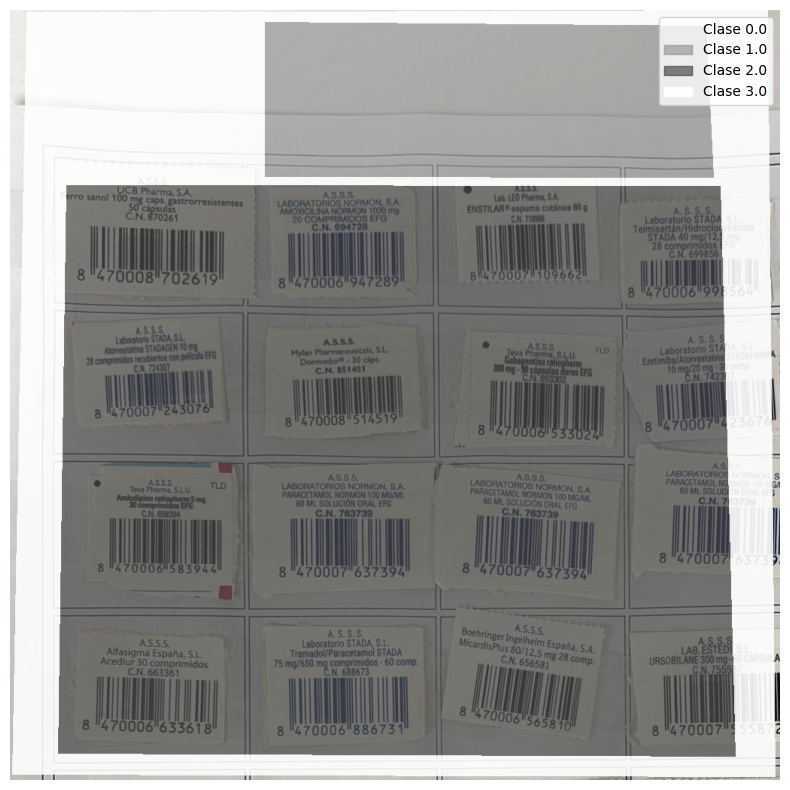

In [54]:
import os
import torch
import numpy as np
import torchvision.transforms as T
import matplotlib.pyplot as plt
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import cv2
from glob import glob
from pathlib import Path
import random
import matplotlib.patches as mpatches

# --- DATASET PERSONALIZADO ---
class SAM2HeaderDataset(Dataset):
    def __init__(self, images_dir, masks_dir, transform=None):
        self.images = sorted(glob(f"{images_dir}/*.jpg"))
        self.masks = sorted(glob(f"{masks_dir}/*.png"))
        self.transform = transform
        self.to_tensor = T.ToTensor()

        # Mapeo de valores de color a clases (ajusta si cambia tu codificación)
        self.label_map = {
            0: 0,      # fondo
            128: 1,    # hoja
            200: 2,    # cabecera
            255: 3     # zona códigos
        }

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        mask_path = self.masks[idx]

        image = Image.open(img_path).convert("RGB")
        raw_mask = np.array(Image.open(mask_path), dtype=np.uint8)

        # Remapeo
        mapped_mask = np.zeros_like(raw_mask, dtype=np.uint8)
        for orig_val, new_class in self.label_map.items():
            mapped_mask[raw_mask == orig_val] = new_class

        image_tensor = self.to_tensor(image)
        mask_tensor = torch.from_numpy(mapped_mask).unsqueeze(0).float()

        return {
            'image': image_tensor,
            'mask': mask_tensor,
            'original_image': image,
            'filename': Path(img_path).name
        }

# --- VISUALIZACIÓN ---
def show_sample(sample):
    img = sample['original_image']
    mask = sample['mask'].squeeze().numpy()

    colors = {
        0: (1, 1, 1, 0),          # fondo
        1: (0.6, 0.6, 0.6, 0.7),  # hoja
        2: (0.3, 0.3, 0.3, 0.7),  # cabecera
        3: (1, 1, 1, 0.9),        # zona códigos
    }

    color_mask = np.zeros((*mask.shape, 4))
    for cls in np.unique(mask):
        color_mask[mask == cls] = colors.get(cls, (1, 0, 0, 0.5))  # rojo si clase no definida

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(img)
    ax.imshow(color_mask)
    patches = [mpatches.Patch(color=colors[c], label=f'Clase {c}') for c in np.unique(mask)]
    ax.legend(handles=patches, loc='upper right')
    ax.axis('off')
    plt.tight_layout()  # 🔧 Esto evita recortes
    plt.show()


# --- USO ---
images_dir = "C:/Users/Andrea/Documents/pruebas/dataset/val/images"
masks_dir = "C:/Users/Andrea/Documents/pruebas/dataset/val/masks"

dataset = SAM2HeaderDataset(images_dir, masks_dir)

# Verificar si el dataset no está vacío
if len(dataset) > 0:
    # Visualiza una muestra aleatoria
    sample = random.choice(dataset)
    show_sample(sample)
else:
    print("El dataset está vacío. Verifica las rutas de images_dir y masks_dir.")


🟢 Muestras aleatorias del set de entrenamiento:


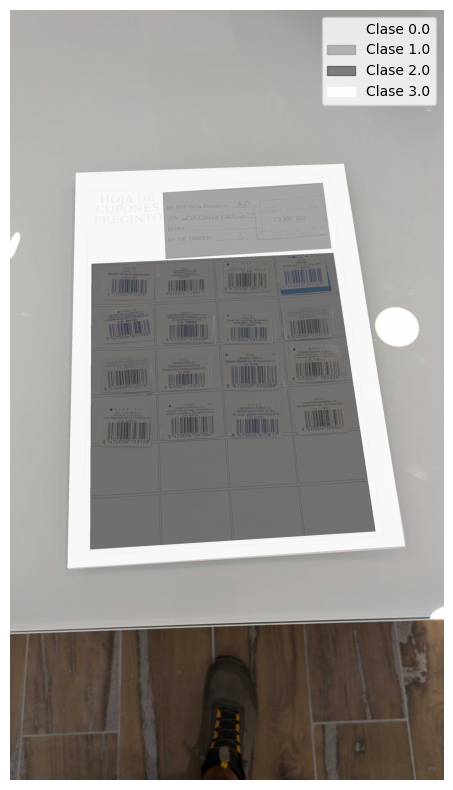

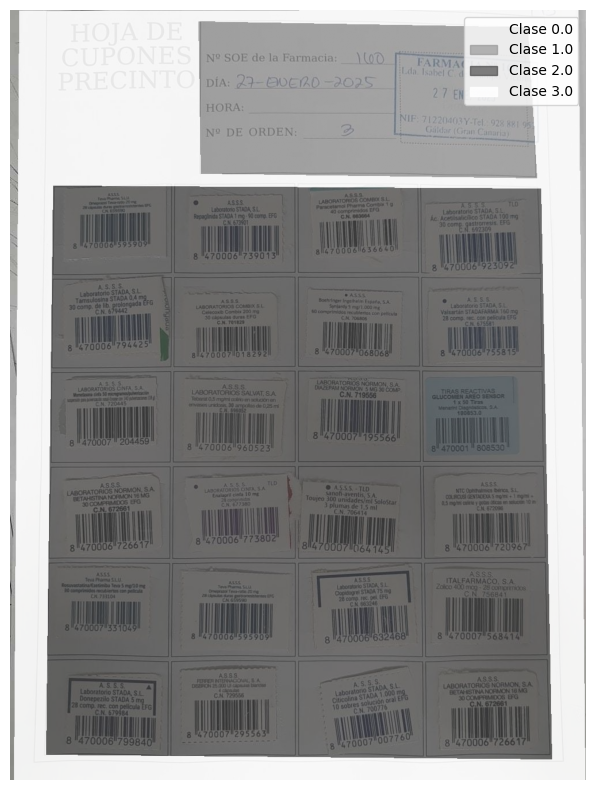

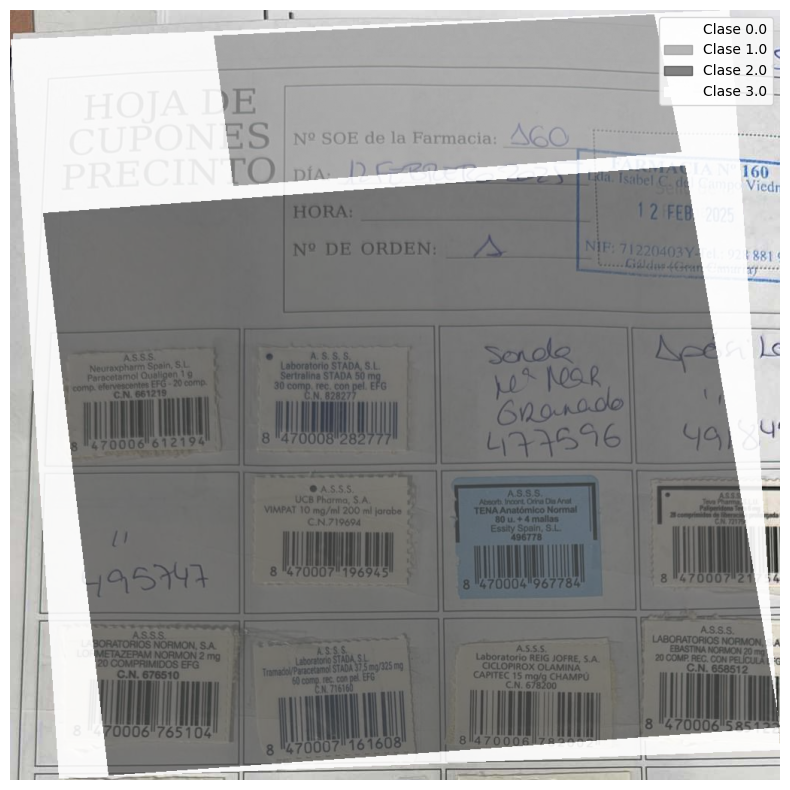

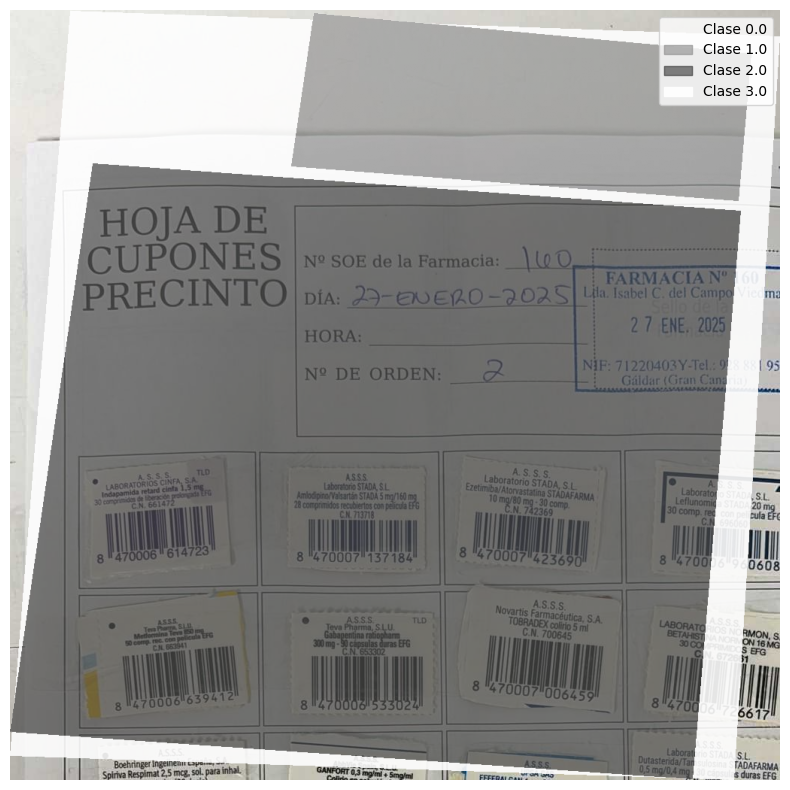

📊 Clases detectadas en 'train': [np.float32(0.0), np.float32(1.0), np.float32(2.0), np.float32(3.0)]
📊 Clases detectadas en 'val': [np.float32(0.0), np.float32(1.0), np.float32(2.0), np.float32(3.0)]
📊 Clases detectadas en 'Test': []


In [ ]:
# --- CARGAR DATASETS ---
def load_dataset(split="train"):
    base_path = "C:/Users/Andrea/Documents/sam2/notebooks/dataset"
    images_dir = os.path.join(base_path, split, "images")
    masks_dir = os.path.join(base_path, split, "masks")
    return SAM2HeaderDataset(images_dir, masks_dir)

train_dataset = load_dataset("train")
val_dataset = load_dataset("val")
test_dataset = load_dataset("test")

# --- VISUALIZAR EJEMPLOS ALEATORIOS ---
def show_random_samples(dataset, num=4):
    indices = random.sample(range(len(dataset)), min(num, len(dataset)))
    for idx in indices:
        show_sample(dataset[idx])

print("🟢 Muestras aleatorias del set de entrenamiento:")
show_random_samples(train_dataset)

# --- VERIFICAR CLASES PRESENTES ---
def check_classes(dataset, name="dataset"):
    all_classes = set()
    for sample in dataset:
        mask = sample['mask'].squeeze().numpy()
        all_classes.update(np.unique(mask))
    print(f"📊 Clases detectadas en '{name}': {sorted(all_classes)}")

check_classes(train_dataset, "train")
check_classes(val_dataset, "val")
check_classes(test_dataset, "test")


In [57]:
print(f"Test - Número de imágenes: {len(test_dataset.images)}")
print(f"Test - Número de máscaras: {len(test_dataset.masks)}")


Test - Número de imágenes: 0
Test - Número de máscaras: 2


In [58]:
if len(test_dataset) > 0:
    show_sample(random.choice(test_dataset))
else:
    print("❌ El dataset de test está vacío.")


❌ El dataset de test está vacío.


In [ ]:
import os
import json
import numpy as np
from PIL import Image, ImageDraw

# Mapa de clases
CLASS_COLOR_MAP = {
    "fondo": 0,
    "hoja": 128,
    "cabecera": 200,
    "codigos": 255,
}

# Rutas
input_json = "C:/Users/Andrea/Documents/sam2/notebooks/dataset/annotations/codigos1.json"
output_dir = "C:/Users/Andrea/Documents/sam2/notebooks/dataset/test/masks"
os.makedirs(output_dir, exist_ok=True)

# Leer el JSON
with open(input_json, 'r') as f:
    data = json.load(f)

height = data['imageHeight']
width = data['imageWidth']
mask = Image.new('L', (width, height), 0)

for shape in data['shapes']:
    label = shape['label'].lower()
    value = CLASS_COLOR_MAP.get(label, 0)

    # 🔧 Convertir puntos a enteros
    points = [tuple(map(int, point)) for point in shape['points']]

    # Dibujar el polígono
    ImageDraw.Draw(mask).polygon(points, outline=value, fill=value)

# Guardar
filename = os.path.splitext(os.path.basename(input_json))[0] + ".png"
mask.save(os.path.join(output_dir, filename))

print(f"✅ Máscara guardada como: {os.path.join(output_dir, filename)}")


FileNotFoundError: [Errno 2] No such file or directory: 'C:/Users/Andrea/Documents/sam2/notebooks/dataset/test/masks\\codigos1.png'

In [74]:
output_dir = "C:/Users/Andrea/Documents/sam2/notebooks/dataset/test/masks"
os.makedirs(output_dir, exist_ok=True)


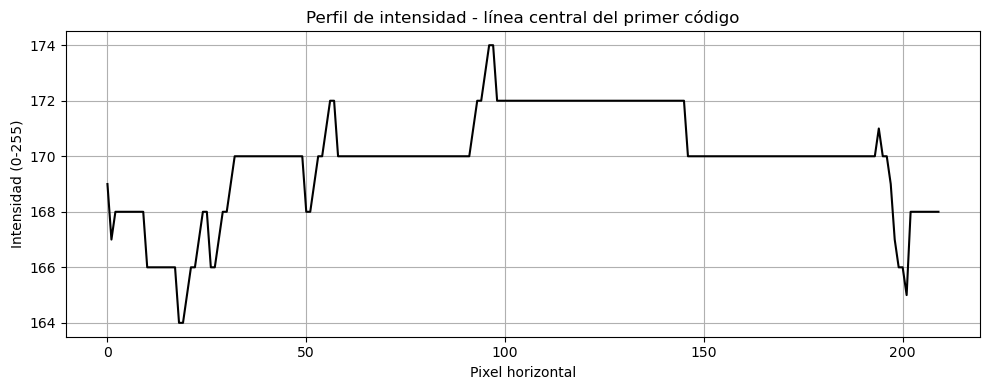

In [15]:
# Reimportar y recargar tras reinicio de estado
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Cargar imagen
image_path = "images/codigos1.jpg"
image = cv2.imread(image_path)

# Convertir a escala de grises
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Coordenadas del primer código de barras (manual aproximada: fila 1, columna 1)
x, y, w, h = 70, 220, 210, 70
barcode_roi = gray[y:y+h, x:x+w]

# Línea de escaneo horizontal (por el centro)
scan_line = barcode_roi[h//2, :]

# Crear gráfico
plt.figure(figsize=(10, 4))
plt.plot(scan_line, color='black')
plt.title("Perfil de intensidad - línea central del primer código")
plt.xlabel("Pixel horizontal")
plt.ylabel("Intensidad (0-255)")
plt.grid(True)
plt.tight_layout()
plt.show()


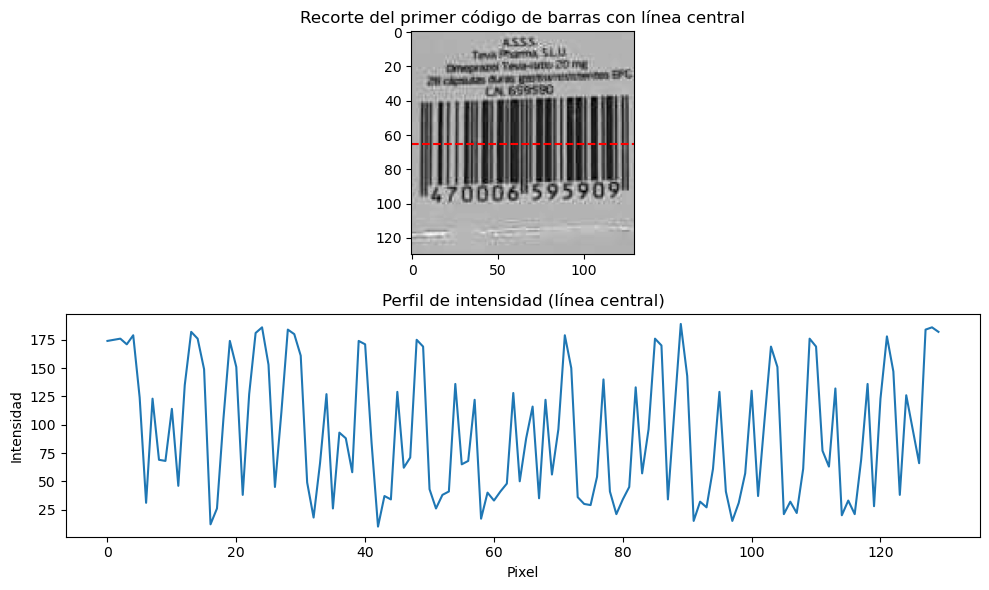

In [44]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Cargar imagen
img_path = "images/codigos1.jpg"
image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

# Coordenadas del primer código (obtenidas manualmente en la exploración anterior)
x, y, w, h = 117, 315, 130, 130
barcode_crop = image[y:y+h, x:x+w]

# Línea central
line_center = barcode_crop[h//2, :]

# Mostrar rectángulo sobre la imagen original y la línea sobre el recorte
fig, axs = plt.subplots(2, 1, figsize=(10, 6))

# Mostrar el recorte del código de barras
axs[0].imshow(barcode_crop, cmap='gray')
axs[0].axhline(y=h//2, color='red', linestyle='--')
axs[0].set_title("Recorte del primer código de barras con línea central")

# Mostrar el perfil de intensidad
axs[1].plot(line_center)
axs[1].set_title("Perfil de intensidad (línea central)")
axs[1].set_xlabel("Pixel")
axs[1].set_ylabel("Intensidad")

plt.tight_layout()
plt.show()


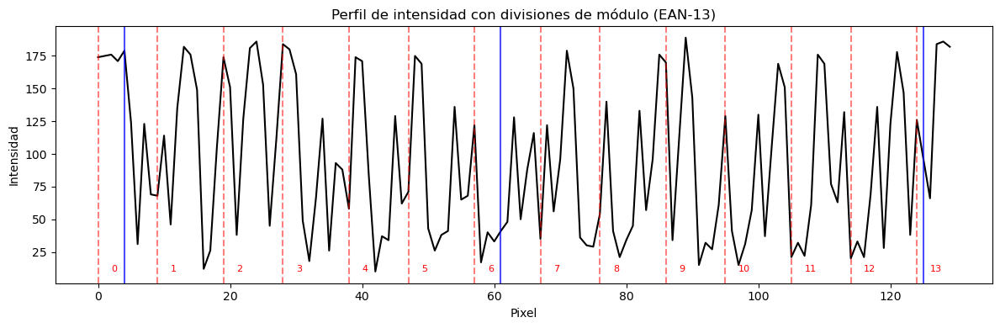

In [45]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Cargar imagen y extraer el recorte del código
img_path = "images/codigos1.jpg"
image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

# Coordenadas proporcionadas (ajustadas si fuera necesario)
x, y, w, h = 117, 315, 130, 130
barcode_crop = image[y:y+h, x:x+w]

# Línea de escaneo
scanline = barcode_crop[h//2, :]
scanline_length = len(scanline)

# Estimar ancho de módulo
num_modules = 95
w = scanline_length / num_modules

# Dibujar la línea con divisiones de módulo
fig, ax = plt.subplots(figsize=(12, 4))
ax.plot(scanline, color='black')
ax.set_title("Perfil de intensidad con divisiones de módulo (EAN-13)")
ax.set_xlabel("Pixel")
ax.set_ylabel("Intensidad")

# Marcar divisiones cada 7 módulos (un dígito)
for i in range(0, num_modules + 1, 7):
    px = int(i * w)
    ax.axvline(px, color='red', linestyle='--', alpha=0.5)
    ax.text(px + 2, 10, f'{i//7}', fontsize=8, color='red')

# Marcar guardias (inicio, centro, final)
for guard in [3, 45, 92]:
    px = int(guard * w)
    ax.axvline(px, color='blue', linestyle='-', alpha=0.7)

plt.tight_layout()
plt.show()


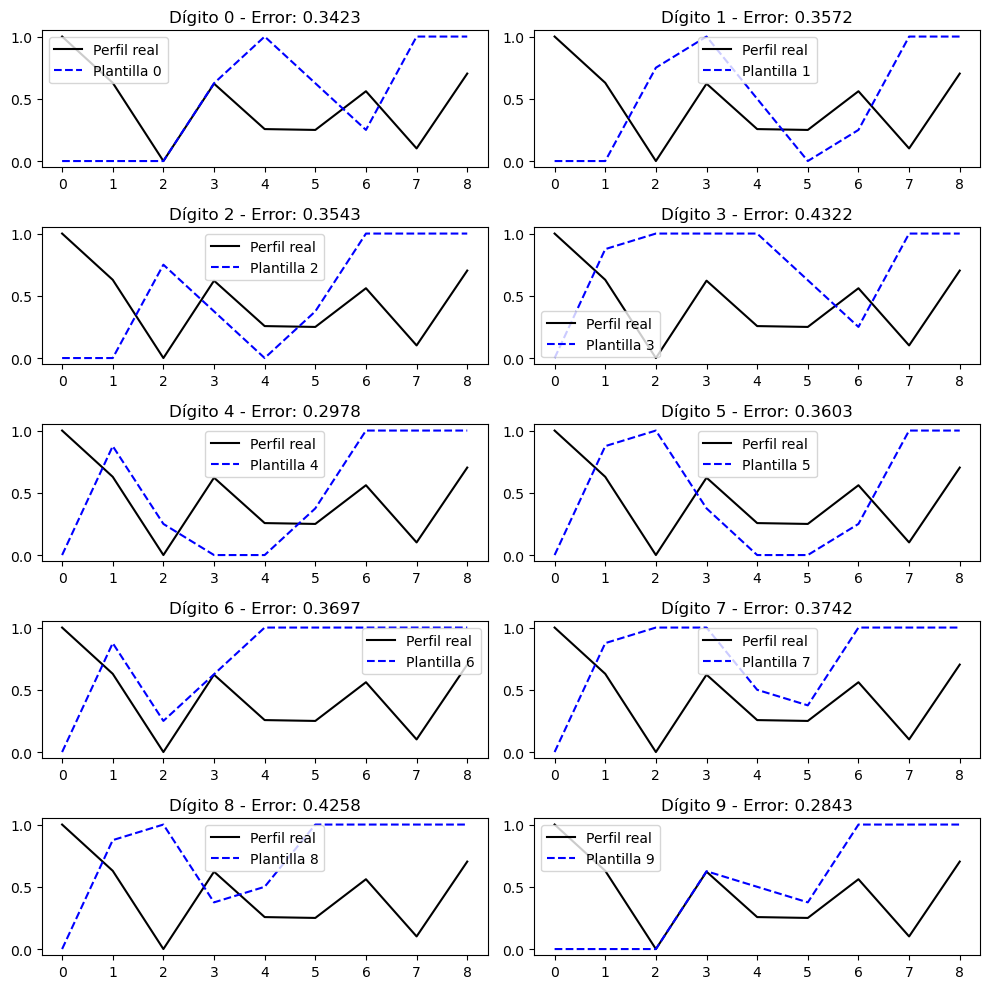

'9'

In [46]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Reutilizar parámetros del código anterior
x, y, w, h = 117, 315, 130, 130
image = cv2.imread("images/codigos1.jpg", cv2.IMREAD_GRAYSCALE)
barcode_crop = image[y:y+h, x:x+w]
scanline = barcode_crop[h//2, :]
scanline_length = len(scanline)

# Estimar ancho de módulo
num_modules = 95
module_w = scanline_length / num_modules

# Extraer el primer dígito (después del guardia inicial: empieza en módulo 3)
start_module = 3 + 7 * 0
end_module = start_module + 7
start_px = int(start_module * module_w)
end_px = int(end_module * module_w)
digit_segment = scanline[start_px:end_px]
digit_segment_norm = (digit_segment - digit_segment.min()) / (digit_segment.ptp() + 1e-8)

# Plantillas EAN-13 (solo L-code por ahora)
ean13_patterns = {
    "L": {
        "0": [3, 2, 1, 1],
        "1": [2, 2, 2, 1],
        "2": [2, 1, 2, 2],
        "3": [1, 4, 1, 1],
        "4": [1, 1, 3, 2],
        "5": [1, 2, 3, 1],
        "6": [1, 1, 1, 4],
        "7": [1, 3, 1, 2],
        "8": [1, 2, 1, 3],
        "9": [3, 1, 1, 2],
    }
}

def generate_template_vector(pattern, total_len):
    """Genera una plantilla vectorial (0 y 1) a partir de un patrón de anchos."""
    bars = []
    color = 0
    for width in pattern:
        bars += [color] * width
        color = 1 - color
    # Escalar a longitud del segmento real
    bars = np.array(bars, dtype=np.float32)
    template = np.interp(np.linspace(0, len(bars), total_len), np.arange(len(bars)), bars)
    return template

# Comparar con plantillas 0–9 y calcular error
fig, axs = plt.subplots(5, 2, figsize=(10, 10))
axs = axs.flatten()

errors = {}

for i, digit in enumerate(map(str, range(10))):
    pattern = ean13_patterns["L"][digit]
    template = generate_template_vector(pattern, len(digit_segment_norm))
    
    axs[i].plot(digit_segment_norm, label='Perfil real', color='black')
    axs[i].plot(template, label=f'Plantilla {digit}', linestyle='--', color='blue')
    axs[i].set_title(f'Dígito {digit} - Error: {np.mean((digit_segment_norm - template)**2):.4f}')
    axs[i].legend()
    
    errors[digit] = np.mean((digit_segment_norm - template)**2)

plt.tight_layout()
plt.show()

# Obtener el mejor candidato
best_digit = min(errors, key=errors.get)
best_digit


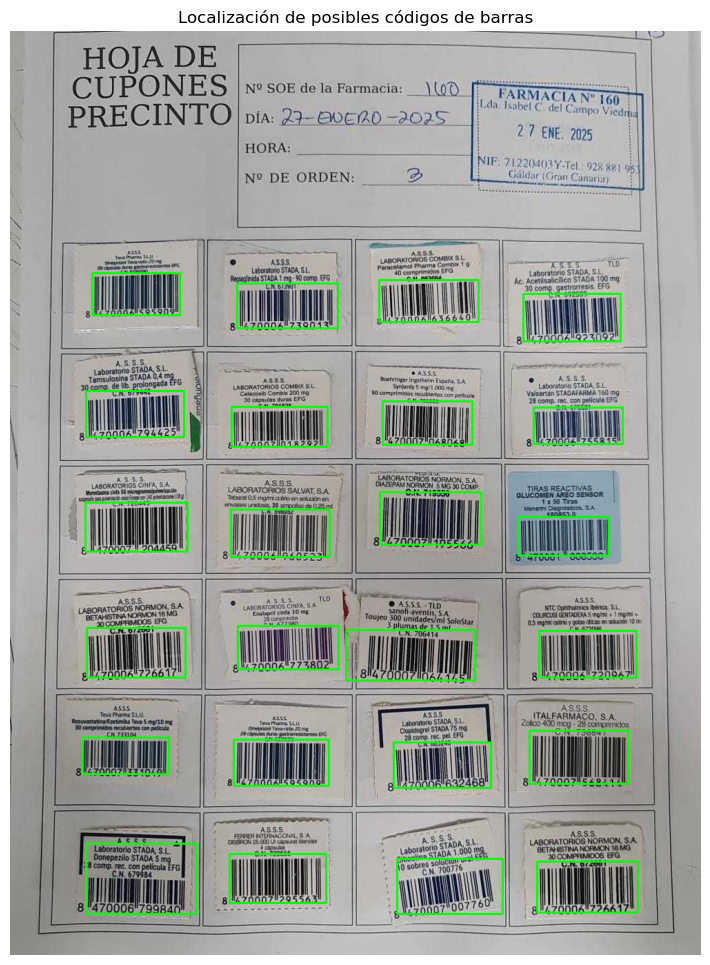

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu

# Cargar imagen
img_path = "images/codigos1.jpg"
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Calcular gradientes horizontal y vertical
Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)

# Calcular mapa de energía: Ie = |Ix| - |Iy|
Ie = np.abs(Ix) - np.abs(Iy)
Ie = np.clip(Ie, 0, 255).astype(np.uint8)

# Filtrado con bloque 31x31
kernel = np.ones((31, 31), np.float32) / (31 * 31)
Is = cv2.filter2D(Ie, -1, kernel)

# Umbralización con Otsu
thresh_val = threshold_otsu(Is)
binary = (Is > thresh_val).astype(np.uint8) * 255

# Buscar contornos (blobs)
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Dibujar resultados sobre copia de la imagen original
result_img = img.copy()
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    if w > 50 and h > 20:  # Umbral para evitar ruido
        cv2.rectangle(result_img, (x, y), (x + w, y + h), (0, 255, 0), 2)

plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
plt.title("Localización de posibles códigos de barras")
plt.axis('off')
plt.show()


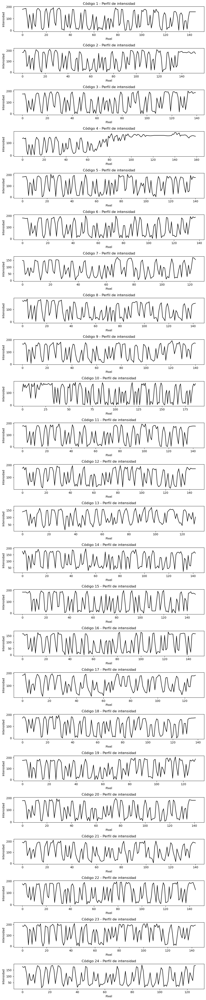

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu

# Volver a cargar imagen y preprocesar
img_path = "images/codigos1.jpg"
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Gradientes y mapa de energía
Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
Ie = np.abs(Ix) - np.abs(Iy)
Ie = np.clip(Ie, 0, 255).astype(np.uint8)

# Filtrado y binarización
kernel = np.ones((31, 31), np.float32) / (31 * 31)
Is = cv2.filter2D(Ie, -1, kernel)
thresh_val = threshold_otsu(Is)
binary = (Is > thresh_val).astype(np.uint8) * 255

# Detección de contornos
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Recorte y escaneo de líneas
scanlines = []
boxes = []
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    if w > 50 and h > 20:
        roi = gray[y:y+h, x:x+w]
        center_line = roi[h//2, :]
        scanlines.append(center_line)
        boxes.append((x, y, w, h))

# Mostrar los perfiles de intensidad de todos los códigos detectados
fig, axs = plt.subplots(len(scanlines), 1, figsize=(10, 2 * len(scanlines)))
if len(scanlines) == 1:
    axs = [axs]

for i, line in enumerate(scanlines):
    axs[i].plot(line, color='black')
    axs[i].set_title(f"Código {i+1} - Perfil de intensidad")
    axs[i].set_xlabel("Pixel")
    axs[i].set_ylabel("Intensidad")

plt.tight_layout()
plt.show()


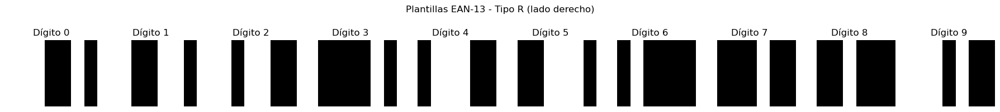

In [19]:
# Diccionarios con las codificaciones EAN-13 para L, G y R
ean13_encodings = {
    "L": {
        '0': '0001101',
        '1': '0011001',
        '2': '0010011',
        '3': '0111101',
        '4': '0100011',
        '5': '0110001',
        '6': '0101111',
        '7': '0111011',
        '8': '0110111',
        '9': '0001011'
    },
    "G": {
        '0': '0100111',
        '1': '0110011',
        '2': '0011011',
        '3': '0100001',
        '4': '0011101',
        '5': '0111001',
        '6': '0000101',
        '7': '0010001',
        '8': '0001001',
        '9': '0010111'
    },
    "R": {
        '0': '1110010',
        '1': '1100110',
        '2': '1101100',
        '3': '1000010',
        '4': '1011100',
        '5': '1001110',
        '6': '1010000',
        '7': '1000100',
        '8': '1001000',
        '9': '1110100'
    }
}

# Visualizar las 10 plantillas del tipo R (lado derecho del EAN13)
fig, axs = plt.subplots(1, 10, figsize=(18, 2))

for i, digit in enumerate(map(str, range(10))):
    code = ean13_encodings["R"][digit]
    signal = [int(b) for b in code]
    axs[i].imshow(np.tile(signal, (10, 1)), cmap="gray", aspect="auto")
    axs[i].set_title(f'Dígito {digit}')
    axs[i].axis('off')

plt.suptitle("Plantillas EAN-13 - Tipo R (lado derecho)")
plt.tight_layout()
plt.show()


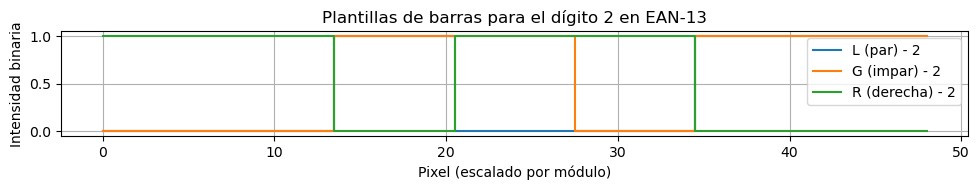

In [20]:
# Definir las plantillas EAN-13 según el estándar
# Cada dígito tiene una codificación en L (impar), G (par) y R (derecha)
ean13_patterns = {
    'L': {
        '0': '0001101',
        '1': '0011001',
        '2': '0010011',
        '3': '0111101',
        '4': '0100011',
        '5': '0110001',
        '6': '0101111',
        '7': '0111011',
        '8': '0110111',
        '9': '0001011',
    },
    'G': {
        '0': '0100111',
        '1': '0110011',
        '2': '0011011',
        '3': '0100001',
        '4': '0011101',
        '5': '0111001',
        '6': '0000101',
        '7': '0010001',
        '8': '0001001',
        '9': '0010111',
    },
    'R': {
        '0': '1110010',
        '1': '1100110',
        '2': '1101100',
        '3': '1000010',
        '4': '1011100',
        '5': '1001110',
        '6': '1010000',
        '7': '1000100',
        '8': '1001000',
        '9': '1110100',
    }
}

# Función para convertir plantilla binaria a señal ideal
def generate_template(digit: str, pattern_type: str, module_width=7):
    """
    Genera la plantilla de barras (array de 0s y 1s) de un dígito EAN13 dado su tipo (L, G, R).
    """
    bin_pattern = ean13_patterns[pattern_type][digit]
    signal = []
    for b in bin_pattern:
        val = 0 if b == '0' else 1
        signal.extend([val] * module_width)
    return np.array(signal)

# Probar la plantilla del dígito '2' tipo L, G y R
template_L = generate_template('2', 'L')
template_G = generate_template('2', 'G')
template_R = generate_template('2', 'R')

# Visualizar las tres plantillas
plt.figure(figsize=(10, 2))
plt.plot(template_L, label='L (par) - 2', drawstyle='steps-mid')
plt.plot(template_G, label='G (impar) - 2', drawstyle='steps-mid')
plt.plot(template_R, label='R (derecha) - 2', drawstyle='steps-mid')
plt.title("Plantillas de barras para el dígito 2 en EAN-13")
plt.xlabel("Pixel (escalado por módulo)")
plt.ylabel("Intensidad binaria")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


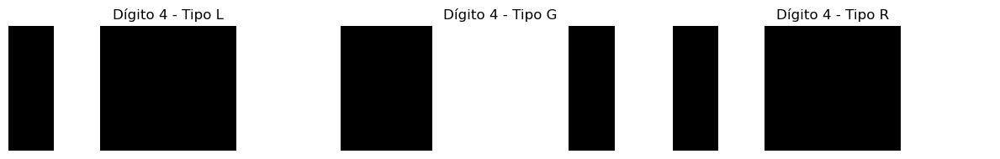

In [21]:
# Definir plantillas EAN-13: L (impar), G (par), R (derecha)
# Cada patrón es una lista de 4 números (ancho en módulos) que suman 7

ean13_patterns = {
    "L": {
        "0": [3, 2, 1, 1],
        "1": [2, 2, 2, 1],
        "2": [2, 1, 2, 2],
        "3": [1, 4, 1, 1],
        "4": [1, 1, 3, 2],
        "5": [1, 2, 3, 1],
        "6": [1, 1, 1, 4],
        "7": [1, 3, 1, 2],
        "8": [1, 2, 1, 3],
        "9": [3, 1, 1, 2],
    },
    "G": {
        "0": [1, 1, 2, 3],
        "1": [1, 2, 2, 2],
        "2": [2, 2, 1, 2],
        "3": [1, 1, 4, 1],
        "4": [2, 3, 1, 1],
        "5": [1, 3, 2, 1],
        "6": [4, 1, 1, 1],
        "7": [2, 1, 3, 1],
        "8": [3, 1, 2, 1],
        "9": [2, 1, 1, 3],
    },
    "R": {
        "0": [3, 2, 1, 1],
        "1": [2, 2, 2, 1],
        "2": [2, 1, 2, 2],
        "3": [1, 4, 1, 1],
        "4": [1, 1, 3, 2],
        "5": [1, 2, 3, 1],
        "6": [1, 1, 1, 4],
        "7": [1, 3, 1, 2],
        "8": [1, 2, 1, 3],
        "9": [3, 1, 1, 2],
    }
}

def generate_digit_template(digit: str, pattern_type: str, module_width=1, height=50):
    """
    Genera una imagen en escala de grises de una plantilla EAN-13 para un dígito.
    """
    pattern = ean13_patterns[pattern_type][digit]
    bars = []

    # Convertimos el patrón a una secuencia binaria (blanco/negro alterno)
    color = 0  # negro comienza
    for width in pattern:
        bars += [color] * (width * module_width)
        color = 1 - color  # alternar

    # Convertimos a imagen
    bar_array = np.array(bars, dtype=np.uint8) * 255
    img = np.tile(bar_array, (height, 1))

    return img

# Visualizar las plantillas para el dígito 4 en sus tres variantes
fig, axs = plt.subplots(1, 3, figsize=(12, 2))

for i, code in enumerate(["L", "G", "R"]):
    template_img = generate_digit_template("4", code, module_width=3, height=40)
    axs[i].imshow(template_img, cmap="gray", aspect="auto")
    axs[i].set_title(f"Dígito 4 - Tipo {code}")
    axs[i].axis("off")

plt.tight_layout()
plt.show()


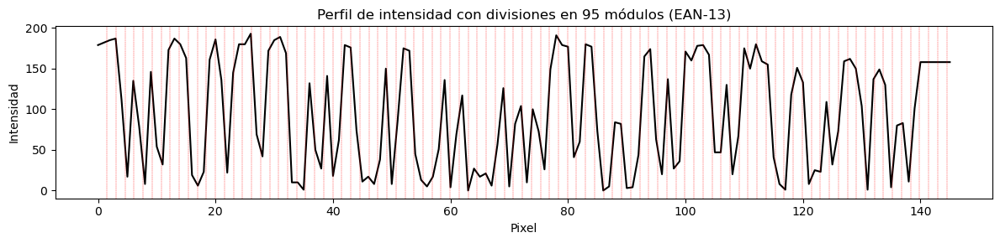

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Volver a cargar imagen y extraer el primer código detectado
img_path = "images/codigos1.jpg"
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Localización con gradientes y filtrado como antes
Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
Ie = np.abs(Ix) - np.abs(Iy)
Ie = np.clip(Ie, 0, 255).astype(np.uint8)
Is = cv2.filter2D(Ie, -1, np.ones((31, 31), np.float32) / (31 * 31))
from skimage.filters import threshold_otsu
thresh_val = threshold_otsu(Is)
binary = (Is > thresh_val).astype(np.uint8) * 255
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Obtener el primer contorno válido
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    if w > 50 and h > 20:
        roi = gray[y:y+h, x:x+w]
        break

# Extraer línea central de escaneo
scan_line = roi[h//2, :]

# Estimar el ancho del módulo (EAN-13 tiene 95 módulos)
module_width = len(scan_line) / 95

# Visualizar el perfil y marcar divisiones de módulos
plt.figure(figsize=(12, 3))
plt.plot(scan_line, color='black')
for i in range(1, 95):
    plt.axvline(x=i*module_width, color='red', linestyle='--', linewidth=0.3)
plt.title("Perfil de intensidad con divisiones en 95 módulos (EAN-13)")
plt.xlabel("Pixel")
plt.ylabel("Intensidad")
plt.tight_layout()
plt.show()


In [24]:
# Extraer los primeros 3 dígitos (6*7 módulos, desde el módulo 3 en adelante)
start_module = 3  # ignorar los primeros 3 módulos (guardia inicial)
num_digits = 3
modules_per_digit = 7
module_width = len(scan_line) / 95

# Extraer los perfiles de intensidad de los 3 dígitos
digit_segments = []
for i in range(num_digits):
    start = int((start_module + i * modules_per_digit) * module_width)
    end = int((start_module + (i + 1) * modules_per_digit) * module_width)
    segment = scan_line[start:end]
    digit_segments.append(segment)

# Función para generar señal binaria a partir de plantilla
def generate_binary_signal(pattern, width):
    signal = []
    color = 0
    for val in pattern:
        signal.extend([color] * int(val * width))
        color = 1 - color
    return np.array(signal)

# Función para encontrar el mejor dígito y tipo (L/G) por MSE
def match_digit_segment(segment, module_width):
    best_digit = None
    best_type = None
    best_score = float('inf')
    segment_resized = cv2.resize(segment.astype(np.uint8).reshape(1, -1), (module_width * 7, 1), interpolation=cv2.INTER_LINEAR).flatten()

    for ptype in ['L', 'G']:
        for digit, pattern in ean13_patterns[ptype].items():
            template = generate_binary_signal(pattern, module_width) * 255
            template = cv2.GaussianBlur(template.astype(np.uint8), (3, 1), 0)
            template = cv2.resize(template.reshape(1, -1), (len(segment_resized), 1), interpolation=cv2.INTER_LINEAR).flatten()
            score = np.mean((segment_resized - template) ** 2)
            if score < best_score:
                best_score = score
                best_digit = digit
                best_type = ptype
    return best_digit, best_type, best_score

# Aplicar coincidencia a los tres segmentos
results = [match_digit_segment(seg, module_width=int(module_width)) for seg in digit_segments]

# Mostrar resultados
results


[('4', 'L', 93.85714285714286),
 ('0', 'G', 78.71428571428571),
 ('4', 'G', 80.71428571428571)]

In [26]:
import cv2
import numpy as np
from skimage.filters import threshold_otsu

# Reutilizamos funciones existentes
def decode_ean13_from_scanline(scan_line):
    module_width = len(scan_line) / 95

    def match_digit_segment(segment, module_width):
        best_digit = None
        best_type = None
        best_score = float('inf')
        segment_resized = cv2.resize(segment.astype(np.uint8).reshape(1, -1), (int(module_width) * 7, 1), interpolation=cv2.INTER_LINEAR).flatten()

        for ptype in ['L', 'G']:
            for digit, pattern in ean13_patterns[ptype].items():
                template = generate_binary_signal(pattern, int(module_width)) * 255
                template = cv2.GaussianBlur(template.astype(np.uint8), (3, 1), 0)
                template = cv2.resize(template.reshape(1, -1), (len(segment_resized), 1), interpolation=cv2.INTER_LINEAR).flatten()
                score = np.mean((segment_resized - template) ** 2)
                if score < best_score:
                    best_score = score
                    best_digit = digit
                    best_type = ptype
        return best_digit, best_type

    def decode_left_digits(scan_line, module_width):
        left_digits = []
        pattern_sequence = []
        for i in range(6):
            start = int((3 + i * 7) * module_width)
            end = int((3 + (i + 1) * 7) * module_width)
            segment = scan_line[start:end]
            digit, ptype = match_digit_segment(segment, module_width)
            left_digits.append(digit)
            pattern_sequence.append(ptype)
        return left_digits, pattern_sequence

    def deduce_first_digit(pattern_sequence):
        key = ''.join(pattern_sequence)
        return parity_table.get(key, "?")

    def decode_right_digits(scan_line, module_width):
        right_digits = []
        for i in range(6):
            start = int((50 + i * 7) * module_width)
            end = int((50 + (i + 1) * 7) * module_width)
            segment = scan_line[start:end]

            best_digit = None
            best_score = float('inf')
            segment_resized = cv2.resize(segment.astype(np.uint8).reshape(1, -1), (int(module_width) * 7, 1), interpolation=cv2.INTER_LINEAR).flatten()

            for digit, pattern in ean13_patterns["R"].items():
                template = generate_binary_signal(pattern, int(module_width)) * 255
                template = cv2.GaussianBlur(template.astype(np.uint8), (3, 1), 0)
                template = cv2.resize(template.reshape(1, -1), (len(segment_resized), 1), interpolation=cv2.INTER_LINEAR).flatten()
                score = np.mean((segment_resized - template) ** 2)
                if score < best_score:
                    best_score = score
                    best_digit = digit
            right_digits.append(best_digit)
        return right_digits

    try:
        left_digits, pattern_seq = decode_left_digits(scan_line, module_width)
        right_digits = decode_right_digits(scan_line, module_width)
        first_digit = deduce_first_digit(pattern_seq)
        return first_digit + ''.join(left_digits) + ''.join(right_digits)
    except Exception as e:
        return f"ERROR: {e}"

# Cargar imagen y detectar scanlines como en tu código
img_path = "images/codigos1.jpg"
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
Ie = np.abs(Ix) - np.abs(Iy)
Ie = np.clip(Ie, 0, 255).astype(np.uint8)
kernel = np.ones((31, 31), np.float32) / (31 * 31)
Is = cv2.filter2D(Ie, -1, kernel)
thresh_val = threshold_otsu(Is)
binary = (Is > thresh_val).astype(np.uint8) * 255
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

scanlines = []
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    if w > 50 and h > 20:
        roi = gray[y:y+h, x:x+w]
        center_line = roi[h//2, :]
        scanlines.append(center_line)

# Decodificar cada código
ean13_codes = [decode_ean13_from_scanline(scan) for scan in scanlines]
ean13_codes = sorted(ean13_codes)  # ordenar visualmente si hay más de uno
ean13_codes


['5404407584465',
 '5555037738466',
 '7283385228012',
 '9560870424420',
 '?039233059520',
 '?094262582020',
 '?167999094717',
 '?278847963029',
 '?293024301294',
 '?298928430425',
 '?312445888875',
 '?361678569004',
 '?394638509499',
 '?407340502028',
 '?546844541079',
 '?589842209027',
 '?600364440020',
 '?603833018074',
 '?795003891276',
 '?827933825158',
 '?835439674016',
 '?849394412624',
 '?907675030384',
 '?980831014540']

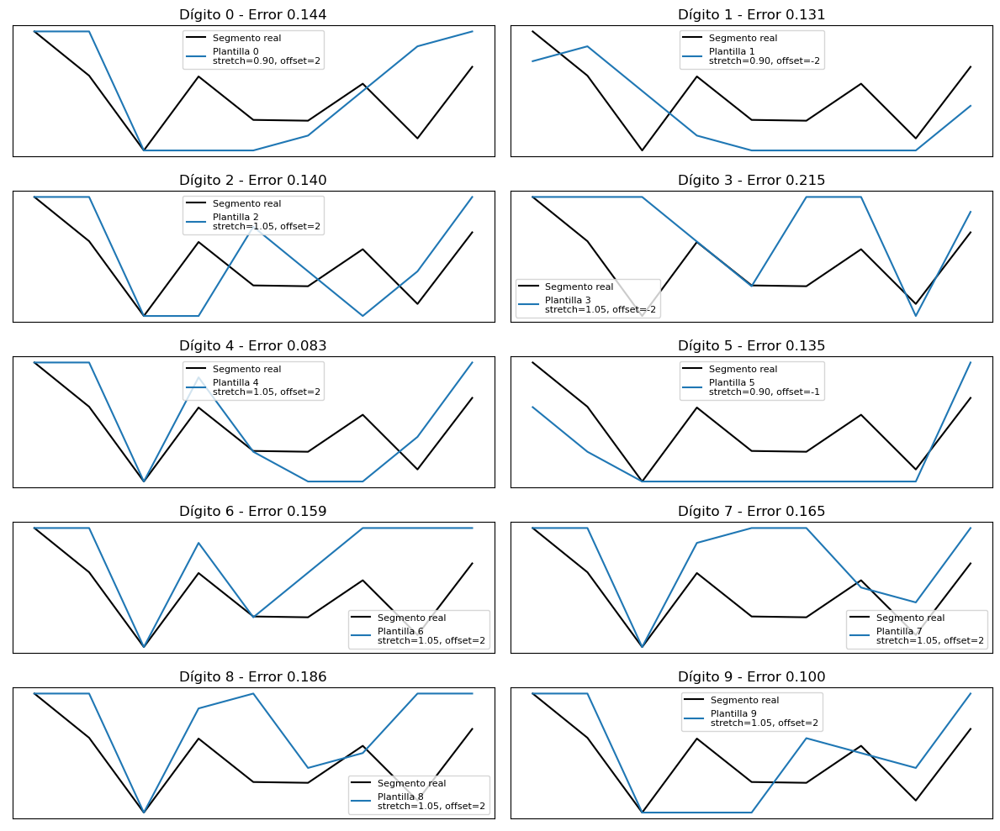

(4,
 0.08251410194351527,
 array([1.   , 1.   , 0.   , 0.875, 0.25 , 0.   , 0.   , 0.375, 1.   ]))

In [47]:
# Reimportar dependencias y ejecutar el código tras reinicio

import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Cargar la imagen y extraer la línea de escaneo ---
img_path = "images/codigos1.jpg"
image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
x, y, w, h = 117, 315, 130, 130
barcode_crop = image[y:y+h, x:x+w]
scanline = barcode_crop[h//2, :]
scanline_length = len(scanline)

# --- Calcular el ancho del módulo ---
num_modules = 95
module_width = scanline_length / num_modules
start_module = 3
digit_modules = 7
start_px = int(start_module * module_width)
end_px = int((start_module + digit_modules) * module_width)
digit_segment = scanline[start_px:end_px]
digit_segment_norm = (digit_segment - digit_segment.min()) / (digit_segment.ptp() + 1e-8)

# --- Plantillas tipo L para EAN-13 ---
ean13_patterns = {
    "L": {
        "0": [3, 2, 1, 1],
        "1": [2, 2, 2, 1],
        "2": [2, 1, 2, 2],
        "3": [1, 4, 1, 1],
        "4": [1, 1, 3, 2],
        "5": [1, 2, 3, 1],
        "6": [1, 1, 1, 4],
        "7": [1, 3, 1, 2],
        "8": [1, 2, 1, 3],
        "9": [3, 1, 1, 2],
    }
}

def generate_template(digit, stretch_factor, output_len):
    """
    Genera una plantilla deformada para un dígito con estiramiento horizontal.
    """
    pattern = ean13_patterns["L"][digit]
    sequence = []
    color = 0
    for width in pattern:
        sequence.extend([color] * int(width * stretch_factor))
        color = 1 - color
    # Interpolar al tamaño del segmento
    template = np.interp(np.linspace(0, len(sequence), num=output_len), np.arange(len(sequence)), sequence)
    return template

# --- Búsqueda de deformaciones para cada dígito ---
results = []
offset_range = np.arange(-2, 3)  # desplazamiento en píxeles
stretch_range = np.linspace(0.9, 1.2, 5)  # escala relativa

for digit in range(10):
    best_error = np.inf
    best_template = None
    best_params = None
    for stretch in stretch_range:
        template = generate_template(str(digit), stretch, len(digit_segment))
        for offset in offset_range:
            # Aplicar desplazamiento
            shifted = np.roll(template, offset)
            error = np.mean((digit_segment_norm - shifted) ** 2)
            if error < best_error:
                best_error = error
                best_template = shifted
                best_params = (stretch, offset)
    results.append((digit, best_error, best_template, best_params))

# --- Mostrar resultados gráficos ---
fig, axs = plt.subplots(5, 2, figsize=(12, 10))
axs = axs.flatten()
for i, (digit, error, template, params) in enumerate(results):
    axs[i].plot(digit_segment_norm, label="Segmento real", color='black')
    axs[i].plot(template, label=f"Plantilla {digit}\nstretch={params[0]:.2f}, offset={params[1]}")
    axs[i].set_title(f"Dígito {digit} - Error {error:.3f}")
    axs[i].legend(fontsize=8)
    axs[i].set_xticks([])
    axs[i].set_yticks([])

plt.tight_layout()
plt.show()

# Mostrar mejor resultado
best_digit = min(results, key=lambda x: x[1])
best_digit[:3]


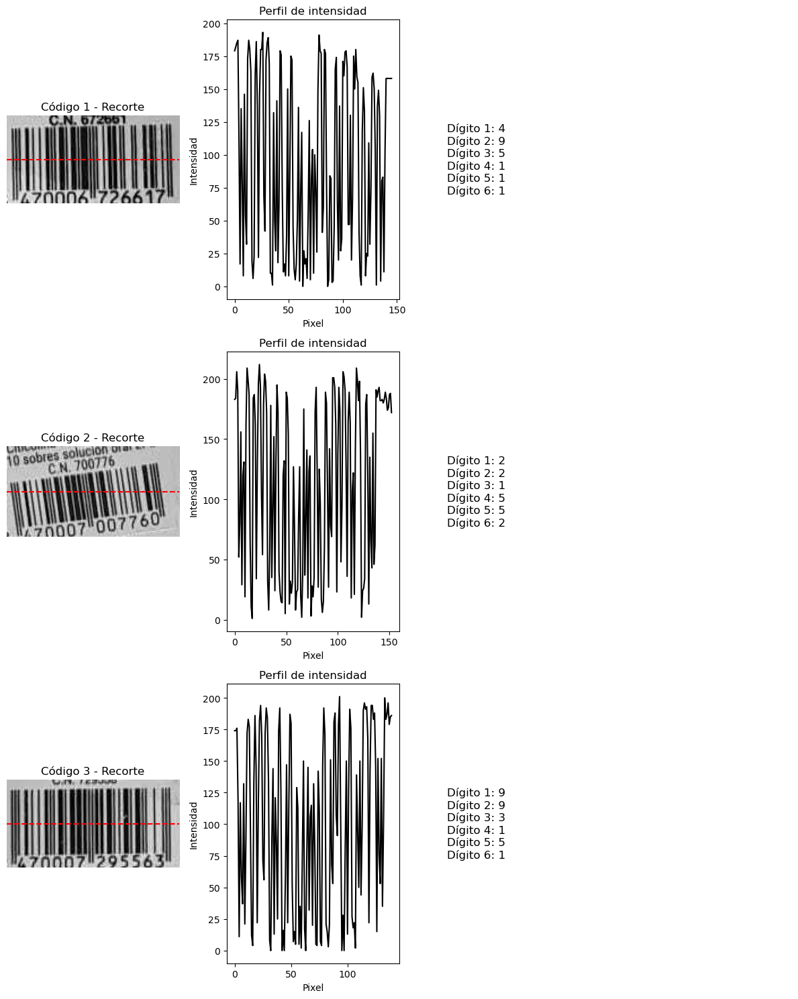

In [48]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
import matplotlib.gridspec as gridspec

# --- 1. Cargar imagen y detectar códigos ---
img_path = "images/codigos1.jpg"
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
Ie = np.abs(Ix) - np.abs(Iy)
Ie = np.clip(Ie, 0, 255).astype(np.uint8)

kernel = np.ones((31, 31), np.float32) / (31 * 31)
Is = cv2.filter2D(Ie, -1, kernel)
thresh_val = threshold_otsu(Is)
binary = (Is > thresh_val).astype(np.uint8) * 255

contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

scanlines = []
boxes = []
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    if w > 50 and h > 20:
        roi = gray[y:y+h, x:x+w]
        center_line = roi[h//2, :]
        scanlines.append(center_line)
        boxes.append((x, y, w, h))

# --- 2. Definir plantillas tipo L (EAN-13) ---
ean13_patterns = {
    "L": {
        "0": [3, 2, 1, 1], "1": [2, 2, 2, 1], "2": [2, 1, 2, 2], "3": [1, 4, 1, 1],
        "4": [1, 1, 3, 2], "5": [1, 2, 3, 1], "6": [1, 1, 1, 4], "7": [1, 3, 1, 2],
        "8": [1, 2, 1, 3], "9": [3, 1, 1, 2]
    }
}

# --- 3. Función para decodificar los primeros 6 dígitos con plantillas deformables ---
def decode_first_6_digits(scanline, num_modules=95, pattern_type="L"):
    module_width = len(scanline) / num_modules
    results = []

    for i in range(6):
        start_module = 3 + i * 7
        start_px = int(start_module * module_width)
        end_px = int((start_module + 7) * module_width)
        segment = scanline[start_px:end_px]
        segment_norm = (segment - segment.min()) / (segment.ptp() + 1e-8)

        best_error = np.inf
        best_digit = None

        for digit in range(10):
            for stretch in np.linspace(0.9, 1.2, 5):
                pattern = ean13_patterns[pattern_type][str(digit)]
                sequence = []
                color = 0
                for width in pattern:
                    sequence.extend([color] * int(width * stretch))
                    color = 1 - color
                template = np.interp(np.linspace(0, len(sequence), num=len(segment)),
                                     np.arange(len(sequence)), sequence)
                for offset in range(-2, 3):
                    shifted = np.roll(template, offset)
                    error = np.mean((segment_norm - shifted) ** 2)
                    if error < best_error:
                        best_error = error
                        best_digit = digit
        results.append(best_digit)
    return results

# --- 4. Aplicar a los primeros códigos y mostrar resultados ---
decoded_codes = []
for i in range(min(3, len(scanlines))):
    decoded = decode_first_6_digits(scanlines[i])
    decoded_codes.append((i+1, decoded))

# Mostrar cada código con su recorte, línea y dígitos
fig = plt.figure(figsize=(12, 15))
gs = gridspec.GridSpec(len(decoded_codes), 3, width_ratios=[1, 1, 2])

for idx, ((x, y, w, h), scanline, decoded) in enumerate(zip(boxes[:3], scanlines[:3], decoded_codes)):
    # Recorte
    ax0 = plt.subplot(gs[idx, 0])
    crop = gray[y:y+h, x:x+w]
    ax0.imshow(crop, cmap='gray')
    ax0.axhline(y=h//2, color='red', linestyle='--')
    ax0.set_title(f"Código {idx+1} - Recorte")
    ax0.axis("off")

    # Perfil de escaneo
    ax1 = plt.subplot(gs[idx, 1])
    ax1.plot(scanline, color='black')
    ax1.set_title("Perfil de intensidad")
    ax1.set_xlabel("Pixel")
    ax1.set_ylabel("Intensidad")

    # Resultados
    ax2 = plt.subplot(gs[idx, 2])
    ax2.axis("off")
    decoded_digits = decoded[1]
    text = "\n".join([
        f"Dígito {i+1}: {digit}" for i, digit in enumerate(decoded_digits)
    ])
    ax2.text(0, 0.5, text, fontsize=12, va="center")

plt.tight_layout()
plt.show()


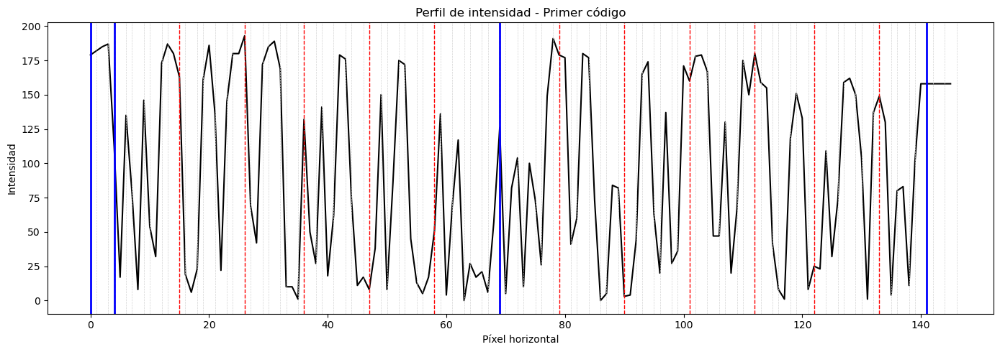

In [49]:
# Dibuja el perfil de intensidad con marcas para todos los módulos
# y segmentación de dígitos y guardias.

# 1. Usamos el primer código detectado
scanline = scanlines[0]

# 2. Calculamos ancho de módulo
num_modules = 95
module_width = len(scanline) / num_modules

# 3. Generamos la gráfica
plt.figure(figsize=(14, 5))
plt.plot(scanline, color='black')
plt.title("Perfil de intensidad - Primer código")
plt.xlabel("Píxel horizontal")
plt.ylabel("Intensidad")

# Dibujar divisiones de módulos
for m in range(96):  # de 0 a 95
    px = int(m * module_width)
    plt.axvline(px, color='lightgray', linestyle='--', linewidth=0.5)

# Dibujar divisiones de dígitos (cada 7 módulos)
for d in range(13):
    px = int((3 + d * 7) * module_width)
    plt.axvline(px, color='red', linestyle='--', linewidth=1)

# Dibujar separadores (guardias): inicio, centro, final
for guard in [0, 3, 45, 92]:
    px = int(guard * module_width)
    plt.axvline(px, color='blue', linestyle='-', linewidth=2)

plt.tight_layout()
plt.show()


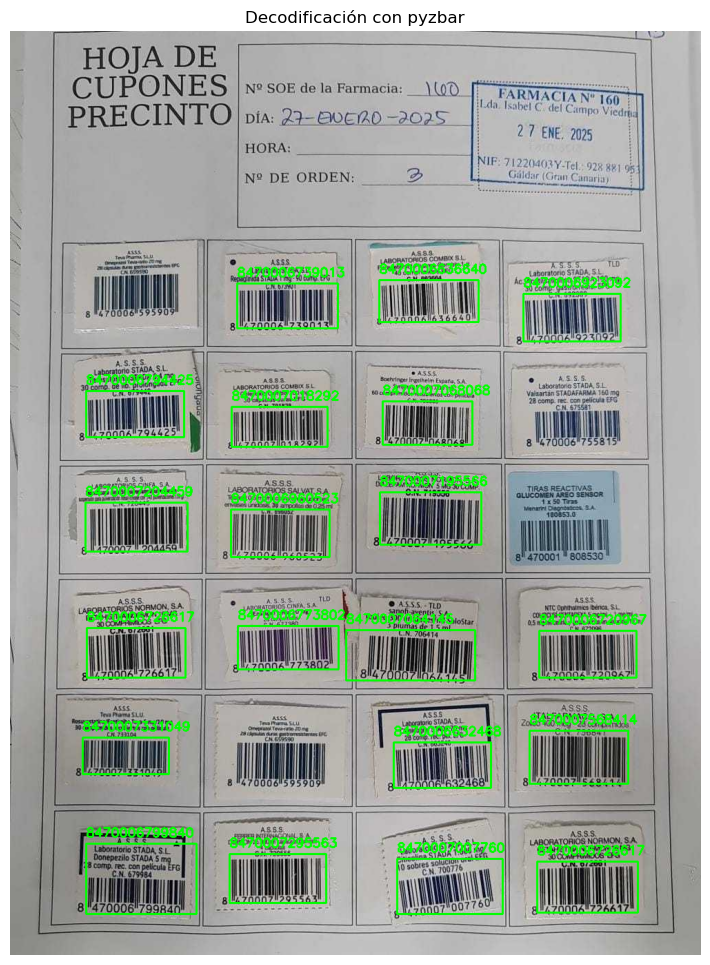

📦 Tipo: EAN13 | 🔢 Código: 8470006726617 | 📍 Box: (764, 1205, 146, 74)
📦 Tipo: EAN13 | 🔢 Código: 8470007007760 | 📍 Box: (561, 1201, 153, 80)
📦 Tipo: EAN13 | 🔢 Código: 8470007295563 | 📍 Box: (318, 1194, 140, 71)
📦 Tipo: EAN13 | 🔢 Código: 8470006799840 | 📍 Box: (110, 1179, 160, 102)
📦 Tipo: EAN13 | 🔢 Código: 8470006632468 | 📍 Box: (556, 1032, 141, 66)
📦 Tipo: EAN13 | 🔢 Código: 8470007331049 | 📍 Box: (105, 1025, 125, 53)
📦 Tipo: EAN13 | 🔢 Código: 8470007568414 | 📍 Box: (753, 1015, 143, 77)
📦 Tipo: EAN13 | 🔢 Código: 8470006720967 | 📍 Box: (767, 870, 141, 68)
📦 Tipo: EAN13 | 🔢 Código: 8470007064145 | 📍 Box: (487, 869, 187, 73)
📦 Tipo: EAN13 | 🔢 Código: 8470006726617 | 📍 Box: (111, 866, 143, 72)
📦 Tipo: EAN13 | 🔢 Código: 8470006773802 | 📍 Box: (330, 863, 146, 63)
📦 Tipo: EAN13 | 🔢 Código: 8470006960523 | 📍 Box: (320, 694, 143, 69)
📦 Tipo: EAN13 | 🔢 Código: 8470007204459 | 📍 Box: (109, 684, 148, 71)
📦 Tipo: EAN13 | 🔢 Código: 8470007195566 | 📍 Box: (536, 669, 147, 76)
📦 Tipo: EAN13 | 🔢 Código: 

In [50]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pyzbar.pyzbar import decode
from skimage.filters import threshold_otsu

# --- Cargar imagen ---
img_path = "images/codigos1.jpg"
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- Mapa de energía (|Ix| - |Iy|) ---
Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
Ie = np.abs(Ix) - np.abs(Iy)
Ie = np.clip(Ie, 0, 255).astype(np.uint8)

# --- Suavizado y umbralización ---
kernel = np.ones((31, 31), np.float32) / (31 * 31)
Is = cv2.filter2D(Ie, -1, kernel)
thresh_val = threshold_otsu(Is)
binary = (Is > thresh_val).astype(np.uint8) * 255

# --- Encontrar contornos ---
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# --- Intentar decodificar cada ROI con pyzbar ---
result_img = img.copy()
decodificados = []

for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    if w > 50 and h > 20:
        roi_color = img[y:y+h, x:x+w]
        decoded = decode(roi_color)

        for d in decoded:
            data = d.data.decode("utf-8")
            tipo = d.type
            decodificados.append((data, tipo, (x, y, w, h)))
            # Dibujar rectángulo
            cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)
            cv2.putText(result_img, data, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX,
                        0.6, (0, 255, 0), 2)

# --- Mostrar resultado ---
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
plt.title("Decodificación con pyzbar")
plt.axis("off")
plt.show()

# Mostrar códigos decodificados
for code, tipo, box in decodificados:
    print(f"📦 Tipo: {tipo} | 🔢 Código: {code} | 📍 Box: {box}")


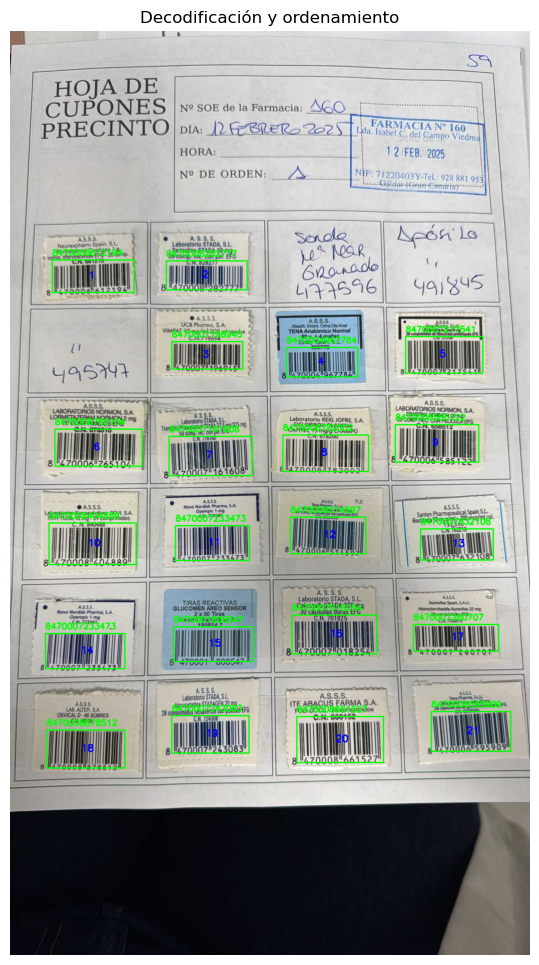

Códigos detectados ordenados:
01 | Tipo: EAN13    | Código: 8470006612194
02 | Tipo: EAN13    | Código: 8470008282777
03 | Tipo: EAN13    | Código: 8470007196945
04 | Tipo: EAN13    | Código: 8470004967784
05 | Tipo: EAN13    | Código: 8470007217541
06 | Tipo: EAN13    | Código: 8470006765104
07 | Tipo: EAN13    | Código: 8470007161608
08 | Tipo: EAN13    | Código: 8470006782002
09 | Tipo: EAN13    | Código: 8470006585122
10 | Tipo: EAN13    | Código: 8470008404889
11 | Tipo: EAN13    | Código: 8470007233473
12 | Tipo: EAN13    | Código: 8470006514597
13 | Tipo: EAN13    | Código: 8470007632108
14 | Tipo: EAN13    | Código: 8470007233473
15 | Tipo: EAN13    | Código: 8470001808547
16 | Tipo: EAN13    | Código: 8470007018254
17 | Tipo: EAN13    | Código: 8470007260707
18 | Tipo: EAN13    | Código: 8470008878512
19 | Tipo: EAN13    | Código: 8470007243083
20 | Tipo: EAN13    | Código: 8470008661527
21 | Tipo: EAN13    | Código: 8470006595909


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pyzbar.pyzbar import decode
from skimage.filters import threshold_otsu
import zxingcpp

# --- Configuración de parámetros ---
Y_THRESHOLD = 40  # Umbral para agrupación vertical de filas
MIN_CONTOUR_WIDTH = 50
MIN_CONTOUR_HEIGHT = 20

# --- Cargar imagen ---
img_path = "images/codigos6.jpg"
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- Mapa de energía (|Ix| - |Iy|) ---
Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
Ie = np.abs(Ix) - np.abs(Iy)
Ie = np.clip(Ie, 0, 255).astype(np.uint8)

# --- Suavizado y umbralización ---
kernel = np.ones((31, 31), np.float32) / (31 * 31)
Is = cv2.filter2D(Ie, -1, kernel)
thresh_val = threshold_otsu(Is)
binary = (Is > thresh_val).astype(np.uint8) * 255

# --- Encontrar contornos ---
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# --- Función para decodificación combinada ---
def decode_combined(roi):
    # Primero intentar con pyzbar
    decoded = decode(roi)
    if not decoded:
        # Si falla, intentar con zxingcpp
        zxing_result = zxingcpp.read_barcodes(roi)
        if zxing_result:
            decoded = [zxing_result[0]]
    return decoded

# --- Procesamiento de contornos ---
result_img = img.copy()
decodificados = []

for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    if w > MIN_CONTOUR_WIDTH and h > MIN_CONTOUR_HEIGHT:
        roi_color = img[y:y+h, x:x+w]
        decoded = decode_combined(roi_color)

        if decoded:
            for d in decoded:
                data = d.data.decode("utf-8") if isinstance(d.data, bytes) else d.data
                tipo = d.type
                box = (x, y, w, h)
                decodificados.append((data, tipo, box))
                
                # Dibujar rectángulo
                cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)
                cv2.putText(result_img, data, (x, y-10), 
                           cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

# --- Cálculo y ordenamiento de centroides ---
if decodificados:
    # Calcular centroides
    centroids = [(x + w//2, y + h//2) for (x, y, w, h) in [box for _, _, box in decodificados]]
    
    # Agrupar por filas
    rows = []
    for cy in sorted(centroids, key=lambda c: c[1]):
        added = False
        for row in rows:
            if abs(row[0][1] - cy[1]) <= Y_THRESHOLD:
                row.append(cy)
                added = True
                break
        if not added:
            rows.append([cy])
    
    # Ordenar filas y crear mapeo
    sorted_centroids = [centroid for row in rows for centroid in sorted(row, key=lambda c: c[0])]
    orden_final = {centroid: i+1 for i, centroid in enumerate(sorted_centroids)}
    
    # Dibujar números de orden
    for code, tipo, box in decodificados:
        centroid = (box[0] + box[2]//2, box[1] + box[3]//2)
        orden = orden_final.get(centroid, -1)
        cv2.putText(result_img, str(orden), (centroid[0]-10, centroid[1]+5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,0,0), 2)

# --- Mostrar resultados ---
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
plt.title("Decodificación y ordenamiento")
plt.axis("off")
plt.show()

# Imprimir resultados ordenados
if decodificados:
    print("Códigos detectados ordenados:")
    sorted_codes = sorted(decodificados, 
                         key=lambda x: orden_final.get((x[2][0]+x[2][2]//2, x[2][1]+x[2][3]//2), 0))
    for idx, (code, tipo, box) in enumerate(sorted_codes, 1):
        print(f"{idx:02d} | Tipo: {tipo:8} | Código: {code}")


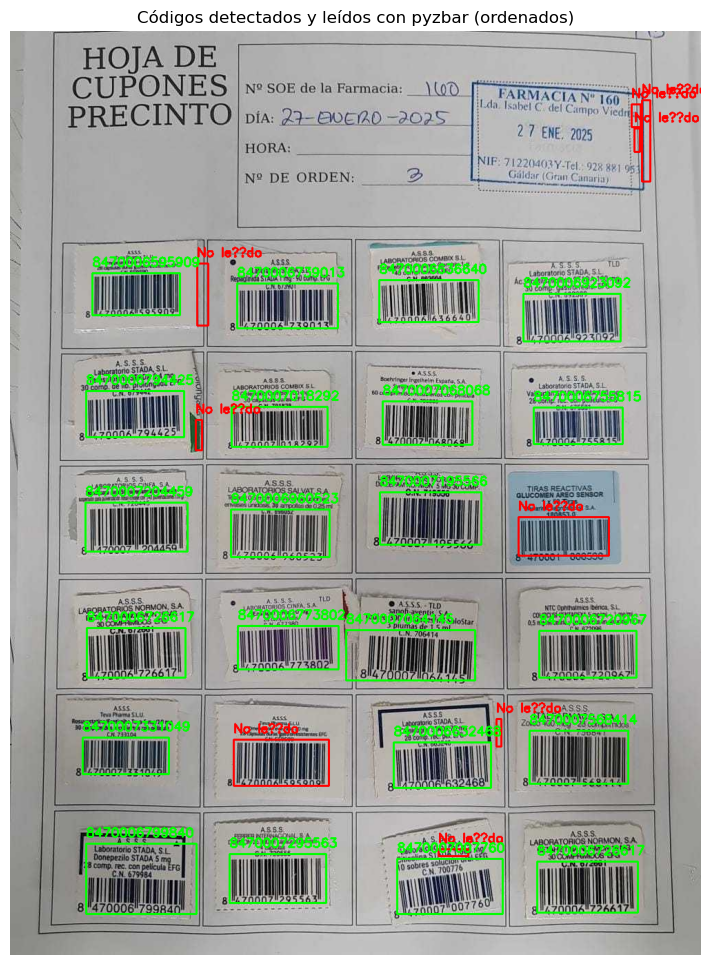

🔎 Resultados:
05. [EAN13] → 8470006595909
06. [EAN13] → 8470006739013
07. [EAN13] → 8470006636640
08. [EAN13] → 8470006923092
09. [EAN13] → 8470006794425
10. [EAN13] → 8470007018292
11. [EAN13] → 8470007068068
12. [EAN13] → 8470006755815
14. [EAN13] → 8470007204459
15. [EAN13] → 8470006960523
16. [EAN13] → 8470007195566
18. [EAN13] → 8470006726617
19. [EAN13] → 8470006773802
20. [EAN13] → 8470007064145
21. [EAN13] → 8470006720967
23. [EAN13] → 8470007331049
25. [EAN13] → 8470006632468
26. [EAN13] → 8470007568414
27. [EAN13] → 8470006799840
28. [EAN13] → 8470007295563
30. [EAN13] → 8470007007760
31. [EAN13] → 8470006726617


In [52]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
from pyzbar.pyzbar import decode

# --- 1. Cargar imagen ---
img_path = "images/codigos1.jpg"
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- 2. Detección con gradientes ---
Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
Ie = np.abs(Ix) - np.abs(Iy)
Ie = np.clip(Ie, 0, 255).astype(np.uint8)

kernel = np.ones((31, 31), np.float32) / (31 * 31)
Is = cv2.filter2D(Ie, -1, kernel)
thresh_val = threshold_otsu(Is)
binary = (Is > thresh_val).astype(np.uint8) * 255

contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# --- 3. Ordenar contornos en orden visual (fila, columna) ---
boxes = [cv2.boundingRect(c) for c in contours if cv2.contourArea(c) > 100]
boxes_sorted = sorted(boxes, key=lambda b: (b[1] // 50, b[0]))

# --- 4. Leer con pyzbar cada código recortado ---
result_img = img.copy()
detected_codes = []

for i, (x, y, w, h) in enumerate(boxes_sorted):
    roi = img[y:y+h, x:x+w]

    # Preprocesamiento para mejorar detección
    pre_roi = cv2.resize(roi, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
    pre_roi = cv2.bilateralFilter(pre_roi, 9, 75, 75)
    pre_roi = cv2.cvtColor(pre_roi, cv2.COLOR_BGR2GRAY)
    pre_roi = cv2.adaptiveThreshold(pre_roi, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                    cv2.THRESH_BINARY, 11, 2)

    decoded = decode(pre_roi)
    if decoded:
        data = decoded[0].data.decode("utf-8")
        tipo = decoded[0].type
        detected_codes.append((i + 1, data, tipo))
        # Dibujar en la imagen original
        cv2.rectangle(result_img, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(result_img, data, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, (0, 255, 0), 2)
    else:
        cv2.rectangle(result_img, (x, y), (x + w, y + h), (0, 0, 255), 2)
        cv2.putText(result_img, "No leído", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, (0, 0, 255), 2)

# --- 5. Mostrar imagen con resultados ---
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
plt.title("Códigos detectados y leídos con pyzbar (ordenados)")
plt.axis("off")
plt.show()

# --- 6. Mostrar texto por consola ---
print("🔎 Resultados:")
for idx, data, tipo in detected_codes:
    print(f"{idx:02d}. [{tipo}] → {data}")


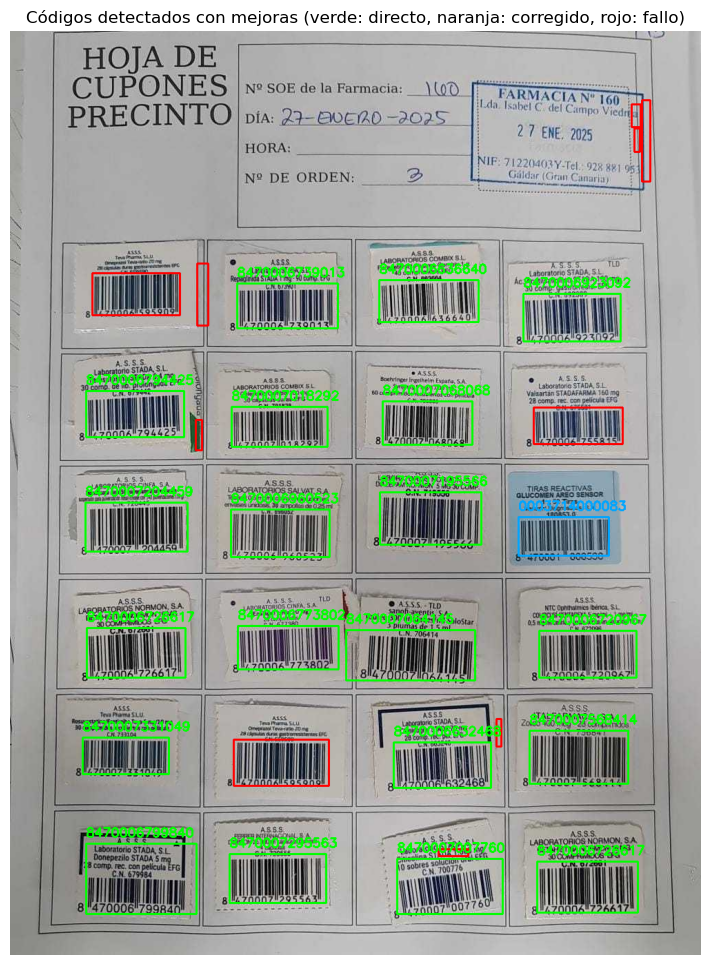

06. [EAN13] → 8470006739013
07. [EAN13] → 8470006636640
08. [EAN13] → 8470006923092
09. [EAN13] → 8470006794425
10. [EAN13] → 8470007018292
11. [EAN13] → 8470007068068
14. [EAN13] → 8470007204459
15. [EAN13] → 8470006960523
16. [EAN13] → 8470007195566
17. [EAN13] → 0003714000083
18. [EAN13] → 8470006726617
19. [EAN13] → 8470006773802
20. [EAN13] → 8470007064145
21. [EAN13] → 8470006720967
23. [EAN13] → 8470007331049
25. [EAN13] → 8470006632468
26. [EAN13] → 8470007568414
27. [EAN13] → 8470006799840
28. [EAN13] → 8470007295563
30. [EAN13] → 8470007007760
31. [EAN13] → 8470006726617


In [53]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pyzbar.pyzbar import decode
from skimage.filters import threshold_otsu

# --- Cargar imagen y detectar códigos como antes ---
img_path = "images/codigos1.jpg"
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
Ie = np.abs(Ix) - np.abs(Iy)
Ie = np.clip(Ie, 0, 255).astype(np.uint8)

kernel = np.ones((31, 31), np.float32) / (31 * 31)
Is = cv2.filter2D(Ie, -1, kernel)
thresh_val = threshold_otsu(Is)
binary = (Is > thresh_val).astype(np.uint8) * 255

contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
boxes = [cv2.boundingRect(c) for c in contours if cv2.contourArea(c) > 100]
boxes_sorted = sorted(boxes, key=lambda b: (b[1] // 50, b[0]))

# --- Función para mejorar imagen y reintentar lectura ---
def enhance_and_try_decode(roi):
    attempts = []
    gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
    for angle in [0, -2, 2, -5, 5]:
        # Rotar
        (h, w) = gray.shape
        M = cv2.getRotationMatrix2D((w // 2, h // 2), angle, 1.0)
        rotated = cv2.warpAffine(gray, M, (w, h), flags=cv2.INTER_LINEAR, borderValue=255)

        # Aumentar contraste (CLAHE)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        contrast = clahe.apply(rotated)

        # Binarización adaptativa
        binary = cv2.adaptiveThreshold(contrast, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                       cv2.THRESH_BINARY, 11, 2)

        # Añadir margen blanco
        padded = cv2.copyMakeBorder(binary, 20, 20, 20, 20, cv2.BORDER_CONSTANT, value=255)

        decoded = decode(padded)
        if decoded:
            return decoded[0].data.decode("utf-8"), decoded[0].type

        attempts.append((angle, padded))  # Para depurar si queremos

    return None, None

# --- Procesar códigos ---
result_img = img.copy()
detected_codes = []

for i, (x, y, w, h) in enumerate(boxes_sorted):
    roi = img[y:y+h, x:x+w]
    decoded = decode(roi)

    if decoded:
        data = decoded[0].data.decode("utf-8")
        tipo = decoded[0].type
        color = (0, 255, 0)
    else:
        # Reintentar con mejoras
        data, tipo = enhance_and_try_decode(roi)
        color = (255, 165, 0) if data else (0, 0, 255)  # naranja si éxito en mejora

    if data:
        detected_codes.append((i+1, data, tipo))
        cv2.putText(result_img, data, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, color, 2)

    cv2.rectangle(result_img, (x, y), (x + w, y + h), color, 2)

# --- Mostrar resultado final ---
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
plt.title("Códigos detectados con mejoras (verde: directo, naranja: corregido, rojo: fallo)")
plt.axis("off")
plt.show()

# Mostrar por consola
for idx, data, tipo in detected_codes:
    print(f"{idx:02d}. [{tipo}] → {data}")



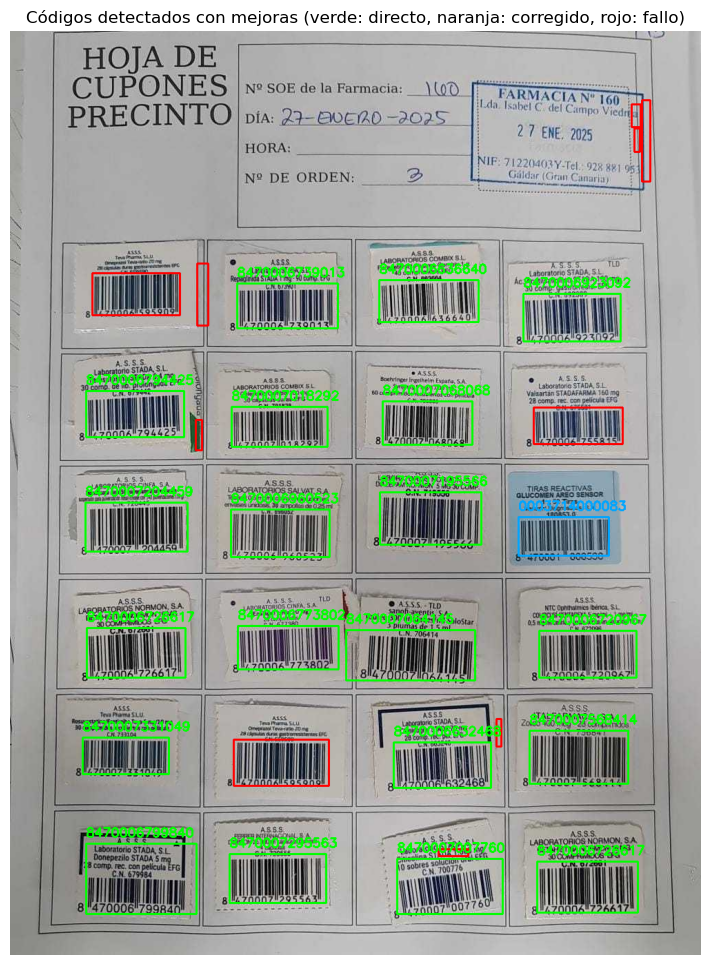

06. [EAN13] → 8470006739013
07. [EAN13] → 8470006636640
08. [EAN13] → 8470006923092
09. [EAN13] → 8470006794425
10. [EAN13] → 8470007018292
11. [EAN13] → 8470007068068
14. [EAN13] → 8470007204459
15. [EAN13] → 8470006960523
16. [EAN13] → 8470007195566
17. [EAN13] → 0003714000083
18. [EAN13] → 8470006726617
19. [EAN13] → 8470006773802
20. [EAN13] → 8470007064145
21. [EAN13] → 8470006720967
23. [EAN13] → 8470007331049
25. [EAN13] → 8470006632468
26. [EAN13] → 8470007568414
27. [EAN13] → 8470006799840
28. [EAN13] → 8470007295563
30. [EAN13] → 8470007007760
31. [EAN13] → 8470006726617


In [54]:
# Reimportar y ejecutar tras reinicio

import cv2
import numpy as np
import matplotlib.pyplot as plt
from pyzbar.pyzbar import decode
from skimage.filters import threshold_otsu

# --- Cargar imagen ---
img_path = "images/codigos1.jpg"
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- Detección de candidatos por gradientes ---
Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
Ie = np.abs(Ix) - np.abs(Iy)
Ie = np.clip(Ie, 0, 255).astype(np.uint8)
kernel = np.ones((31, 31), np.float32) / (31 * 31)
Is = cv2.filter2D(Ie, -1, kernel)
thresh_val = threshold_otsu(Is)
binary = (Is > thresh_val).astype(np.uint8) * 255

contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
boxes = [cv2.boundingRect(c) for c in contours if cv2.contourArea(c) > 100]
boxes_sorted = sorted(boxes, key=lambda b: (b[1] // 50, b[0]))

# --- Función de mejora y reintento ---
def enhance_and_try_decode(roi):
    attempts = []
    gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
    for angle in [0, -2, 2, -5, 5]:
        (h, w) = gray.shape
        M = cv2.getRotationMatrix2D((w // 2, h // 2), angle, 1.0)
        rotated = cv2.warpAffine(gray, M, (w, h), flags=cv2.INTER_LINEAR, borderValue=255)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        contrast = clahe.apply(rotated)
        binary = cv2.adaptiveThreshold(contrast, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                       cv2.THRESH_BINARY, 11, 2)
        padded = cv2.copyMakeBorder(binary, 20, 20, 20, 20, cv2.BORDER_CONSTANT, value=255)
        decoded = decode(padded)
        if decoded:
            return decoded[0].data.decode("utf-8"), decoded[0].type
        attempts.append((angle, padded))
    return None, None

# --- Procesar cada código detectado ---
result_img = img.copy()
detected_codes = []

for i, (x, y, w, h) in enumerate(boxes_sorted):
    roi = img[y:y+h, x:x+w]
    decoded = decode(roi)
    if decoded:
        data = decoded[0].data.decode("utf-8")
        tipo = decoded[0].type
        color = (0, 255, 0)
    else:
        data, tipo = enhance_and_try_decode(roi)
        color = (255, 165, 0) if data else (0, 0, 255)
    if data:
        detected_codes.append((i+1, data, tipo))
        cv2.putText(result_img, data, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, color, 2)
    cv2.rectangle(result_img, (x, y), (x + w, y + h), color, 2)

# --- Mostrar resultados ---
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
plt.title("Códigos detectados con mejoras (verde: directo, naranja: corregido, rojo: fallo)")
plt.axis("off")
plt.show()

# Mostrar por consola
for idx, data, tipo in detected_codes:
    print(f"{idx:02d}. [{tipo}] → {data}")


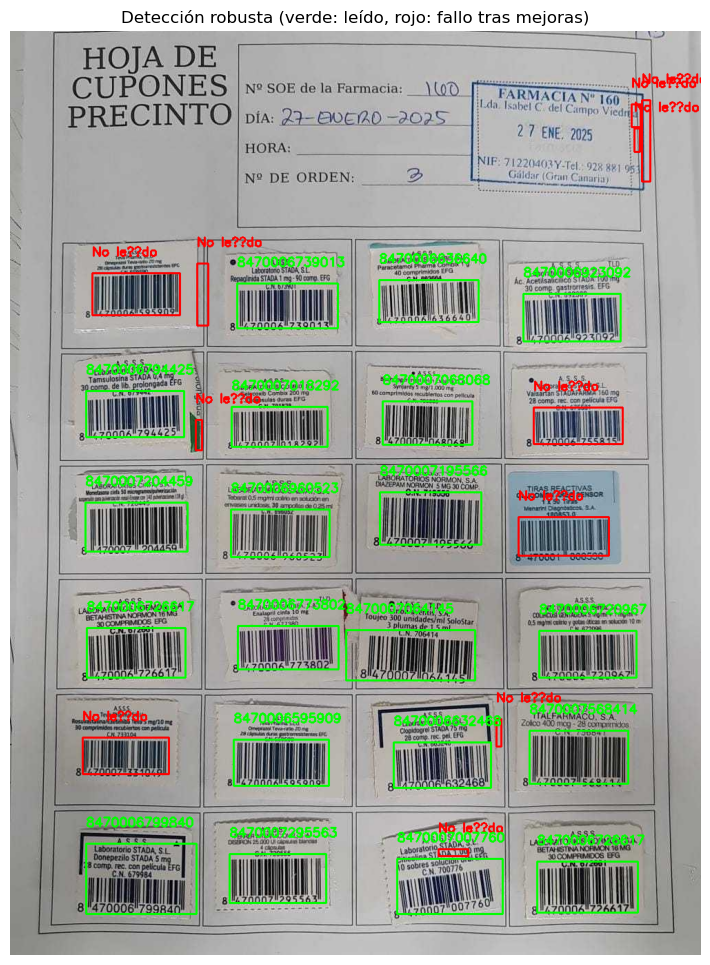

06. [EAN13] → 8470006739013
07. [EAN13] → 8470006636640
08. [EAN13] → 8470006923092
09. [EAN13] → 8470006794425
10. [EAN13] → 8470007018292
11. [EAN13] → 8470007068068
14. [EAN13] → 8470007204459
15. [EAN13] → 8470006960523
16. [EAN13] → 8470007195566
18. [EAN13] → 8470006726617
19. [EAN13] → 8470006773802
20. [EAN13] → 8470007064145
21. [EAN13] → 8470006720967
24. [EAN13] → 8470006595909
25. [EAN13] → 8470006632468
26. [EAN13] → 8470007568414
27. [EAN13] → 8470006799840
28. [EAN13] → 8470007295563
30. [EAN13] → 8470007007760
31. [EAN13] → 8470006726617


In [56]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pyzbar.pyzbar import decode
from skimage.filters import threshold_otsu

# --- Cargar imagen y convertir a escala de grises ---
img_path = "images/codigos1.jpg"
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- Detección de candidatos por gradientes ---
Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
Ie = np.abs(Ix) - np.abs(Iy)
Ie = np.clip(Ie, 0, 255).astype(np.uint8)
kernel = np.ones((31, 31), np.float32) / (31 * 31)
Is = cv2.filter2D(Ie, -1, kernel)
thresh_val = threshold_otsu(Is)
binary = (Is > thresh_val).astype(np.uint8) * 255

contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
boxes = [cv2.boundingRect(c) for c in contours if cv2.contourArea(c) > 100]
boxes_sorted = sorted(boxes, key=lambda b: (b[1] // 50, b[0]))

# --- Función de mejora más robusta ---
def robust_enhance_and_try_decode(roi):
    decoded = decode(roi)
    if decoded:
        return decoded[0].data.decode("utf-8"), decoded[0].type

    # Convertir a escala de grises
    gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)

    for angle in range(-15, 16, 3):
        (h, w) = gray.shape
        M = cv2.getRotationMatrix2D((w // 2, h // 2), angle, 1.0)
        rotated = cv2.warpAffine(gray, M, (w, h), flags=cv2.INTER_LINEAR, borderValue=255)

        # Aumentar resolución
        zoomed = cv2.resize(rotated, None, fx=3, fy=3, interpolation=cv2.INTER_CUBIC)

        # Contraste adaptativo (CLAHE)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        contrast = clahe.apply(zoomed)

        # Binarización adaptativa
        binary = cv2.adaptiveThreshold(contrast, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                       cv2.THRESH_BINARY, 11, 2)

        # Margen blanco
        padded = cv2.copyMakeBorder(binary, 20, 20, 20, 20, cv2.BORDER_CONSTANT, value=255)

        # Probar normal y con imagen invertida
        for img_try in [padded, 255 - padded]:
            decoded = decode(img_try)
            if decoded:
                return decoded[0].data.decode("utf-8"), decoded[0].type

    return None, None

# --- Procesamiento con mejoras ---
result_img = img.copy()
detected_codes = []
pad = 15  # margen alrededor del ROI original

for i, (x, y, w, h) in enumerate(boxes_sorted):
    x0 = max(x - pad, 0)
    y0 = max(y - pad, 0)
    x1 = min(x + w + pad, img.shape[1])
    y1 = min(y + h + pad, img.shape[0])
    roi = img[y0:y1, x0:x1]

    data, tipo = robust_enhance_and_try_decode(roi)
    if data:
        color = (0, 255, 0)
        detected_codes.append((i+1, data, tipo))
        cv2.putText(result_img, data, (x, y0 - 10), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, color, 2)
    else:
        color = (0, 0, 255)
        cv2.putText(result_img, "No leído", (x, y0 - 10), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, color, 2)

    cv2.rectangle(result_img, (x, y), (x + w, y + h), color, 2)

# --- Mostrar resultados ---
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
plt.title("Detección robusta (verde: leído, rojo: fallo tras mejoras)")
plt.axis("off")
plt.show()

# Mostrar por consola
for idx, data, tipo in detected_codes:
    print(f"{idx:02d}. [{tipo}] → {data}")


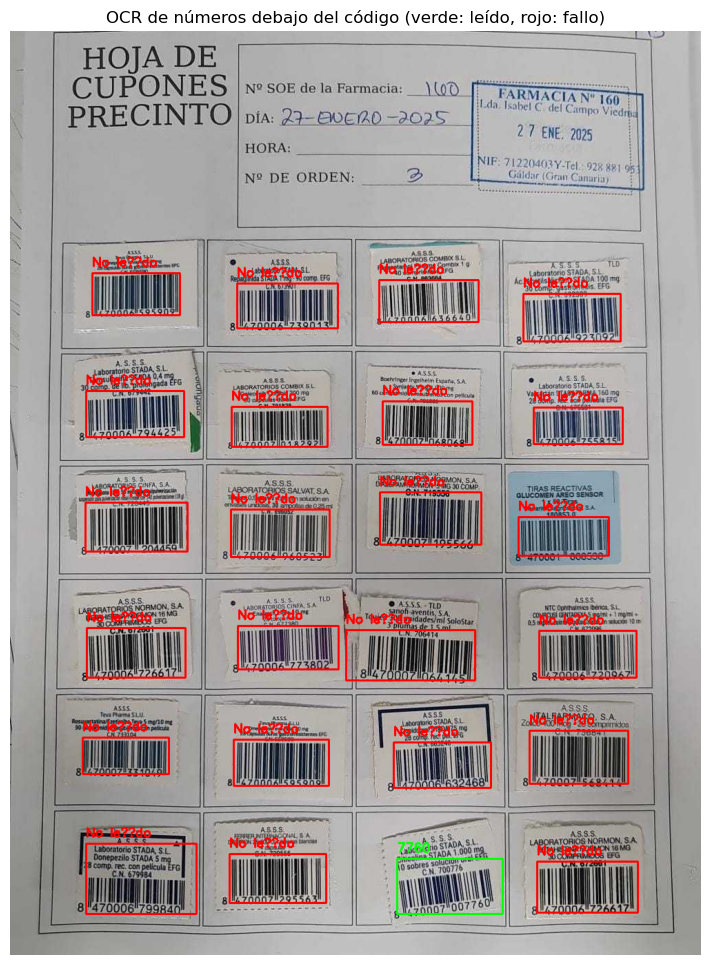

🔢 Código leído en (561, 1201): 7760


In [6]:
# Reejecutar tras reinicio del entorno
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pytesseract
from skimage.filters import threshold_otsu

# --- Cargar imagen y convertir a escala de grises ---
img_path = "images/codigos1.jpg"
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- Calcular mapa de energía y binarizar ---
Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
Ie = np.abs(Ix) - np.abs(Iy)
Ie = np.clip(Ie, 0, 255).astype(np.uint8)

kernel = np.ones((31, 31), np.float32) / (31 * 31)
Is = cv2.filter2D(Ie, -1, kernel)
thresh_val = threshold_otsu(Is)
binary = (Is > thresh_val).astype(np.uint8) * 255

# --- Encontrar contornos ---
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# --- Aplicar OCR de Tesseract en la parte inferior de cada recuadro ---
result_img = img.copy()
ocr_results = []

for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    if w > 50 and h > 20:
        roi = gray[y:y+h, x:x+w]
        number_zone = roi[int(h * 0.65):h, :]  # parte inferior

        # Preprocesar con binarización
        _, binarized = cv2.threshold(number_zone, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # OCR con Tesseract (solo números, sin estructura)
        config = "--psm 7 -c tessedit_char_whitelist=0123456789"
        text = pytesseract.image_to_string(binarized, config=config).strip()

        # Dibujar resultado
        color = (0, 255, 0) if text else (0, 0, 255)
        cv2.rectangle(result_img, (x, y), (x + w, y + h), color, 2)
        cv2.putText(result_img, text if text else "No leído", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, color, 2)

        if text:
            ocr_results.append((x, y, text))

# --- Mostrar imagen con resultados ---
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
plt.title("OCR de números debajo del código (verde: leído, rojo: fallo)")
plt.axis("off")
plt.show()

# Mostrar por consola
for x, y, text in sorted(ocr_results, key=lambda t: (t[1], t[0])):
    print(f"🔢 Código leído en ({x}, {y}): {text}")


In [8]:
import easyocr
reader = easyocr.Reader(['en'])

# Luego de recortar `number_zone`...
results = reader.readtext(number_zone, detail=0)
text = results[0] if results else ""


Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


In [10]:
!pip install paddleocr
!pip install paddlepaddle -f https://www.paddlepaddle.org.cn/whl/simple

   ---------------------------------------- 2.4/2.4 MB 12.2 MB/s eta 0:00:00
   ---------------------------------------- 2.8/2.8 MB 14.7 MB/s eta 0:00:00
   ---------------------------------------- 46.2/46.2 MB 14.5 MB/s eta 0:00:00
   ---------------------------------------- 1.6/1.6 MB 7.9 MB/s eta 0:00:00
Looking in links: https://www.paddlepaddle.org.cn/whl/simple
   ---------------------------------------- 97.0/97.0 MB 11.1 MB/s eta 0:00:00


In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from paddleocr import PaddleOCR
from skimage.filters import threshold_otsu

# --- Inicializar PaddleOCR ---
ocr = PaddleOCR(use_angle_cls=True, lang='en')

# --- Cargar imagen y convertir a escala de grises ---
img_path = "images/codigos1.jpg"
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- Detectar zonas tipo código de barras ---
Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
Ie = np.abs(Ix) - np.abs(Iy)
Ie = np.clip(Ie, 0, 255).astype(np.uint8)

kernel = np.ones((31, 31), np.float32) / (31 * 31)
Is = cv2.filter2D(Ie, -1, kernel)
thresh_val = threshold_otsu(Is)
binary = (Is > thresh_val).astype(np.uint8) * 255

contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# --- Aplicar OCR solo a los recortes detectados como cupones ---
result_img = img.copy()
cupon_results = []

for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    if w > 50 and h > 20:
        roi = img[y:y+h, x:x+w]
        ocr_result = ocr.ocr(roi, cls=True)

        if ocr_result is not None and isinstance(ocr_result, list) and len(ocr_result) > 0:
            for line in ocr_result[0]:
                text = line[1][0]
                score = line[1][1]
                if score > 0.6 and text.strip().isdigit() and 8 <= len(text.strip()) <= 15:
                    cupon_results.append((x, y, w, h, text.strip()))
                    # Dibujar sobre la imagen
                    cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)
                    cv2.putText(result_img, text.strip(), (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX,
                                0.6, (0, 255, 0), 2)


# --- Mostrar imagen con los códigos detectados en los cupones ---
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
plt.title("Códigos detectados en los cupones (PaddleOCR por recorte)")
plt.axis("off")
plt.show()

# Mostrar resultados por consola
for i, (x, y, w, h, text) in enumerate(sorted(cupon_results, key=lambda r: (r[1], r[0]))):
    print(f"{i+1:02d}. 📦 Código detectado: {text} en posición ({x}, {y})")


[2025/04/19 12:30:42] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, use_gcu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='C:\\Users\\Alcampo/.paddleocr/whl\\det\\en\\en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='C:\\Users\\Alcampo/.paddleocr/whl\\rec\\en\\en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 3

[2025/04/19 12:30:46] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.03818631172180176
[2025/04/19 12:30:46] ppocr DEBUG: cls num  : 0, elapsed : 0
[2025/04/19 12:30:46] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0


TypeError: 'NoneType' object is not iterable